
All the activities are divided from block 1 to block 12

##Exploring the given Data files-Observation has been written after mount drive

###Understanding the structure of data-Block1:

  1.Installation

  2.Import all libraries 

  3.EDA included shape,description,info,Print Top 5 rows

###Missing points in data:Block2:

  1.Find all the missing values and treat them carefully.



###Visualizing different patterns:Block3:

1.Assignment group target column exploration with top 10 groups,Unique groups,Total group counts.

2.Caller column  exploration with plot for multiple groups for top 10 caller

3.Max word and min word and plot of word distribution for description and short description column

###Dealing with missing values:Block4:

1.We will create a combine column and there we will conatinate two groups as NAN + string is NAN so we will use THE at place of NAN values which will be removed later with stop word removal

###Finding inconsistencies in the data:Block:5
1.We will try lang detect and polyglot library and will see language accuracy.


2.We will divide the dataset to two part one with having rows with english language and one with non english languages.


3.Then we will apply Google translation on non english rows and merge the non english part with english part and create final feature column 

4.We will check language accuracy after translation




###Visualizing different text features:Block:6

1.And visualize final feature column in word cloud with and without stop words

2.And also calculate top 50 frequent word





###Text preprocessing Block:7

1.We will do preprocessing and removed digit special character url mailID Extra spaces accented chars newlines HTML and also expand contractions and lemmatization will also be applied.We have created a single function inside it.

2.We will visualize in word cloud and check any difference

###Creating tokens as required :Block:8

We will tokenize the final feature and remove stop word and have final tokenized feature for embedding.


###Creating word vocabulary from the corpus of report text data




In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive/


In [2]:
EMBEDDING_FILE = '/content/drive/My Drive/glove.6B.100d.txt'

###Install all libraraies

In [3]:
pip install plotly

In [4]:
# Install spaCy (run in terminal/prompt)
import sys
!{sys.executable} -m pip install spacy

# Download spaCy's  'en' Model
!{sys.executable} -m spacy download en

✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')
✔ Linking successful
/usr/local/lib/python3.6/dist-packages/en_core_web_sm -->
/usr/local/lib/python3.6/dist-packages/spacy/data/en
You can now load the model via spacy.load('en')


In [5]:
pip install beautifulsoup4

In [6]:
pip install langdetect

     |████████████████████████████████| 983kB 9.3MB/s 
  Created wheel for langdetect: filename=langdetect-1.0.8-cp36-none-any.whl size=993195 sha256=9b63569d5f456932ad8552d9fb6f3f8650be3bb035cfa624afb0c33c2e2dfc46
  Stored in directory: /root/.cache/pip/wheels/8d/b3/aa/6d99de9f3841d7d3d40a60ea06e6d669e8e5012e6c8b947a57
Successfully built langdetect


In [7]:
pip install -U pycld2

     |████████████████████████████████| 41.4MB 89kB/s 
  Created wheel for pycld2: filename=pycld2-0.41-cp36-cp36m-linux_x86_64.whl size=9833565 sha256=ff2d4e566843f1d796d42abcc6388b5fd68aa1791de6d1d86e2c5c5bac628382
  Stored in directory: /root/.cache/pip/wheels/c6/8f/e9/08a1a8932a490175bd140206cd86a3dbcfc70498100de11079
Successfully built pycld2


In [8]:
pip install polyglot

     |████████████████████████████████| 133kB 5.9MB/s 
  Created wheel for polyglot: filename=polyglot-16.7.4-py2.py3-none-any.whl size=52559 sha256=2183da9576c1a59ed9b30a99634aaceed2fcba483676831c42754acc98966008
  Stored in directory: /root/.cache/pip/wheels/5e/91/ef/f1369fdc1203b0a9347d4b24f149b83a305f39ab047986d9da
Successfully built polyglot


In [9]:
# install googletrans using pip
!pip install googletrans



     |████████████████████████████████| 61kB 4.4MB/s 
     |████████████████████████████████| 51kB 4.1MB/s 
     |████████████████████████████████| 952kB 9.4MB/s 
     |████████████████████████████████| 71kB 6.2MB/s 
     |████████████████████████████████| 61kB 5.9MB/s 
     |████████████████████████████████| 102kB 7.4MB/s 
  Created wheel for googletrans: filename=googletrans-3.0.0-cp36-none-any.whl size=15736 sha256=ab74abb47b2bd2457f928eb2572d7cac8da715478a4c5babadeaa4df11ab98cc
  Stored in directory: /root/.cache/pip/wheels/28/1a/a7/eaf4d7a3417a0c65796c547cff4deb6d79c7d14c2abd29273e
  Created wheel for contextvars: filename=contextvars-2.4-cp36-none-any.whl size=7666 sha256=fb7304899f5f147d32167a2d7656525fcd4486b12d1897f64e104a2b8c1bda6f
  Stored in directory: /root/.cache/pip/wheels/a5/7d/68/1ebae2668bda2228686e3c1cf16f2c2384cea6e9334ad5f6de
Successfully built googletrans contextvars


In [10]:
pip install contractions

     |████████████████████████████████| 245kB 8.4MB/s 
     |████████████████████████████████| 317kB 12.9MB/s 
  Created wheel for pyahocorasick: filename=pyahocorasick-1.4.0-cp36-cp36m-linux_x86_64.whl size=81701 sha256=a7660f37540905695631179bb8d0307fd0b390bddf0c6d05774b6c7f766a0365
  Stored in directory: /root/.cache/pip/wheels/0a/90/61/87a55f5b459792fbb2b7ba6b31721b06ff5cf6bde541b40994
Successfully built pyahocorasick


In [11]:
pip install Unidecode

In [12]:
pip install pyicu

     |████████████████████████████████| 235kB 6.2MB/s 
  Created wheel for pyicu: filename=PyICU-2.5-cp36-cp36m-linux_x86_64.whl size=1252646 sha256=4f5ed9b510eadeeb6ec81e68aa3d44f5df719532ece7c0a82cadce98cf37cfd2
  Stored in directory: /root/.cache/pip/wheels/07/3a/28/09f90c38785945ddf9af61b7add1aa62a740f40e259626ef3a
Successfully built pyicu


In [13]:
pip install nltk


In [14]:
import nltk

nltk.download('punkt')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [15]:
pip install collections-extended

###Import all libraries

In [16]:
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import seaborn as sns

import matplotlib.pyplot as plt

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [17]:
from sklearn import preprocessing 
from sklearn.model_selection import train_test_split 
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

In [18]:
from keras.models import Model
from keras.layers import LSTM, Activation, Dense, Dropout, Input, Embedding
from keras.optimizers import RMSprop
from keras.preprocessing.text import Tokenizer
from keras.preprocessing import sequence
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping

In [19]:
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential

In [20]:
from sklearn.metrics import classification_report
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_selection import SelectKBest, chi2
import numpy as np

In [21]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score,recall_score,confusion_matrix
from sklearn.linear_model import SGDClassifier
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.linear_model import LogisticRegression
from yellowbrick.classifier import ClassificationReport

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


In [22]:
import spacy
#from spacy_cld import LanguageDetector


import langdetect
#import langid

import icu
from polyglot.detect import Detector
# import the library
import googletrans
from googletrans import Translator
import re
import contractions
import unidecode

In [23]:
import pandas as pd
import plotly
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.io as pio
pio.renderers.default = 'colab'
from plotly.offline import init_notebook_mode, iplot
from collections import Counter
from wordcloud import WordCloud, STOPWORDS 


In [24]:
from langdetect import detect

#List of common functions

##1.Some Common functions in word cloud

In [25]:
def wordcloud_plot(text):
  wordcloud_spam = WordCloud(width = 800, height = 800, 
                      background_color ='white', 
                      min_font_size = 10).generate(" ".join(w for w in text))

  # Lines 2 - 5
  plt.figure(figsize = (8,8))
  plt.imshow(wordcloud_spam, interpolation='bilinear')
  plt.axis("off")
  plt.show()

In [26]:
def wordcloud_group(text):
  #wordcloud_spam = WordCloud(width = 800, height = 800, 
                      #background_color ='white', 
                      #min_font_size = 10).generate(" ".join(w for w in text))
  wordcloud = WordCloud(collocations=False).generate(" ".join(w for w in text))
  # Lines 2 - 5
  plt.figure(figsize = (8,8))
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis("off")
  plt.show()

In [27]:
def wordcloud_plot_stop(text):

  wordcloud_withstop = WordCloud(stopwords=STOPWORDS,width = 800, height = 800, 
                      background_color ='white', 
                      min_font_size = 10).generate(" ".join(w for w in text))

  # Lines 2 - 5
  plt.figure(figsize = (8,8))
  plt.imshow(wordcloud_withstop, interpolation='bilinear')
  plt.axis("off")
  plt.show()

##Some common functions for language detection

In [28]:
def get_language(text):
    return Detector(''.join(x for x in text if x.isprintable()), quiet=True).languages[0].name


In [29]:
    
def fn_lan_detect(df):                                        
   try:                                                          
        return detect(df)            
   except:                                   
        return 'no'                                                  


##3.Some common functions for Text preprocessing

In [30]:
def cleantext_lower(text): 
    return text.lower() 

In [31]:
def cleantext_remove_punctuation(text): 
    result = re.sub(r'[^\w\s]',' ',text) 
    return result

In [32]:
def cleantext_remove_url(text):
  result=re.sub(r"http\S+", "", text)
  return result

In [33]:
def cleantext_removeHTML(text):
    from bs4 import BeautifulSoup
    soup = BeautifulSoup(text, "html.parser")
    clean_Text = soup.get_text()
    return clean_Text

In [34]:
def removeAccentedChars(text):
    cleanText = unidecode.unidecode(text)
    return cleanText

In [35]:
def expandContractions(text):
    
    return contractions.fix(text)

In [36]:
def cleantext_removeSpecialChars(text, remove_digits=False):
    pattern = r'[^a-zA-z0-9\s]' if not remove_digits else r'[^a-zA-z\s]'
    text = re.sub(pattern, ' ', text)
    cleanText = re.sub(r"[^a-zA-Z0-9]+", ' ', text)
    return text

In [37]:
def removeDuplicates(text):
    text = text.split(" ")
    for i in range(0, len(text)):
        text[i] = "".join(text[i])
        dupli = Counter(text)
        cleanText = " ".join(dupli.keys())
    return cleanText

In [38]:
def correct_spelling(x, dic):
    for word in dic.keys():
        x = x.replace(word, dic[word])
    return x

In [39]:
nlp = spacy.load('en', disable=['parser', 'ner'])
def cleantext_textLemmatize(text):
    text = nlp(text)
    text = ' '.join([word.lemma_ if word.lemma_ != '-PRON-' else word.text for word in text])
    return text
#Used spacy as wordnet was giving some error

In [40]:
def predict_ml_model(sclf,X_train_count,y_train_count,X_test_count,y_test_count):
  sclf.fit(X_train_count, y_train_count)
  y_pred = sclf.predict(X_test_count)

  print('accuracy %s' % accuracy_score(y_pred, y_test_count))
  print('Training score:',sclf.score(X_train_count, y_train_count)*100)
  TrainAcc=sclf.score(X_train_count, y_train_count)*100
  TestAcc=sclf.score(X_test_count,y_test_count)*100
  Accq=accuracy_score(y_pred, y_test_count)
  prec=precision_score(y_pred, y_test_count,average='weighted')*100
  rec=recall_score(y_pred, y_test_count,average='weighted')*100
  f1s=f1_score(y_pred, y_test_count,average='weighted')*100
  print('Testing score:',sclf.score(X_test_count,y_test_count)*100)
  #print(classification_report(y_test_count, y_pred))
  data = [TrainAcc, TestAcc, prec, rec,f1s]
  return data

###Block1:Understanding the structure of data

Import excel data and print top 5 rows

In [41]:
df = pd.read_excel (r'/content/drive/My Drive/Project/input_data (2).xlsx')
df.head(5)

,Short description,Description,Caller,Assignment group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0


In [42]:
#Shape of the data  
df.shape

(8500, 4)

In [43]:
#Name of columns
df.columns

Index(['Short description', 'Description', 'Caller', 'Assignment group'], dtype='object')

In [44]:
#Data type of each attribute
df.info()
#There are total 9 null values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8492 non-null   object
 1   Description        8499 non-null   object
 2   Caller             8500 non-null   object
 3   Assignment group   8500 non-null   object
dtypes: object(4)
memory usage: 265.8+ KB


In [45]:
#5 point summary
df.describe(include="all")

,Short description,Description,Caller,Assignment group
count,8492,8499,8500,8500
unique,7481,7817,2950,74
top,password reset,the,bpctwhsn kzqsbmtp,GRP_0
freq,38,56,810,3976


##Observation of Block1
We have explored the data set and found the below points:


1.It has 8500 rows and 4 columns.

2.Short Description and Description and caller are independent columns and Group is the depenent variable which we need to predict.It is a classification problem where we have to predict the group column value with respect to other independent variable.


3.First we have obsered Short description and description and what we found is there are many tickets where only short description is not sufficient to take it as main feature.There are many tickets for which both the short description and description are same.Different variations are there.

4.Next we observed that there are many rows where description/short description is written in other languages which is not english.


5.We have observed the dependent variables where we found that it is very unbalanced later we plot the distribution too which shows it has high imbalance.


6.There are some repeatative rows having same information in all the columns.



##Block2:Missing points in data:


In [46]:
#Checking the presence of missing values
df.isnull().sum()

Short description    8
Description          1
Caller               0
Assignment group     0
dtype: int64

In [47]:
df.loc[df["Description"].isnull()]

,Short description,Description,Caller,Assignment group
4395,i am locked out of skype,NaN,viyglzfo ajtfzpkb,GRP_0


In [48]:
df.loc[df["Short description"].isnull()]

,Short description,Description,Caller,Assignment group
2604,NaN,\r\n\r\nreceived from: ohdrnswl.rezuibdt@gmail...,ohdrnswl rezuibdt,GRP_34
3383,NaN,\r\n-connected to the user system using teamvi...,qftpazns fxpnytmk,GRP_0
3906,NaN,-user unable tologin to vpn.\r\n-connected to...,awpcmsey ctdiuqwe,GRP_0
3910,NaN,-user unable tologin to vpn.\r\n-connected to...,rhwsmefo tvphyura,GRP_0
3915,NaN,-user unable tologin to vpn.\r\n-connected to...,hxripljo efzounig,GRP_0
3921,NaN,-user unable tologin to vpn.\r\n-connected to...,cziadygo veiosxby,GRP_0
3924,NaN,name:wvqgbdhm fwchqjor\nlanguage:\nbrowser:mic...,wvqgbdhm fwchqjor,GRP_0
4341,NaN,\r\n\r\nreceived from: eqmuniov.ehxkcbgj@gmail...,eqmuniov ehxkcbgj,GRP_0


##Observation of Block 2:
We have found out 9 missing values .1 in description and 8 in short description.The rows are printed.

##Block3:Visualizing different pattern
##1.Explore Assign Group Column and do all kind of visualization

In [49]:
#Count the number of values:
df['Assignment group'].value_counts()

GRP_0     3976
GRP_8      661
GRP_24     289
GRP_12     257
GRP_9      252
          ... 
GRP_67       1
GRP_35       1
GRP_73       1
GRP_64       1
GRP_70       1
Name: Assignment group, Length: 74, dtype: int64

In [50]:
#Group 0 has highest number of tickets

###Plot the group in sorted order

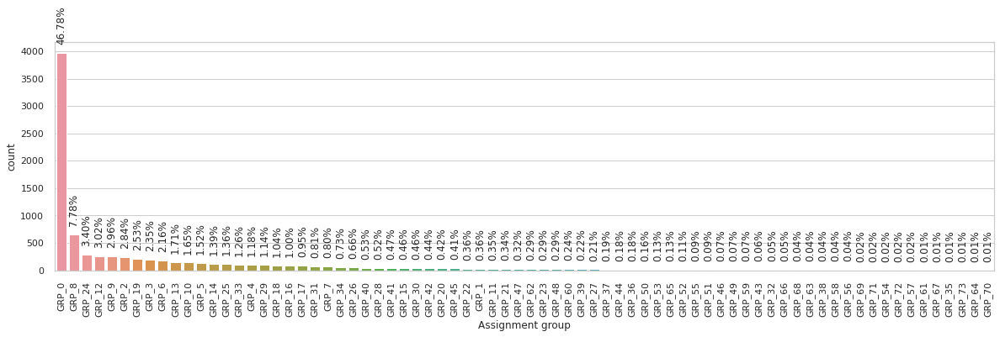

In [51]:
from IPython.display import display
pd.options.display.max_columns = None
pd.options.display.max_rows = None
sns.set(style="whitegrid")
plt.figure(figsize=(20,5))
ax = sns.countplot(x="Assignment group", data=df, order=df["Assignment group"].value_counts().index)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
for p in ax.patches:
  ax.annotate(str(format(p.get_height()/len(df.index)*100, '.2f')+"%"), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'bottom', rotation=90, xytext = (0, 10), textcoords = 'offset points')

###Top 10 groups visualization


Text(0.5, 1.0, 'Top 10 frequent groups')

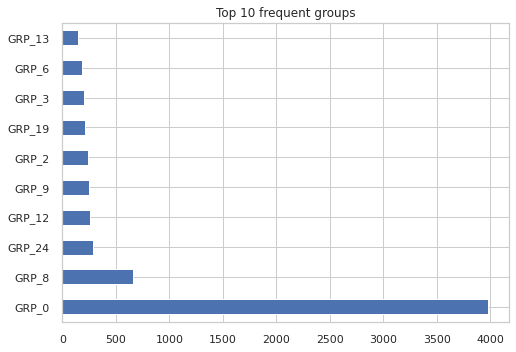

In [52]:
df['Assignment group'].value_counts()[:10].plot(kind='barh')
plt.title("Top 10 frequent groups")

###Top 50 and bottom 50 groups visualization

In [53]:
df_top_50= df['Assignment group'].value_counts().nlargest(50).reset_index()

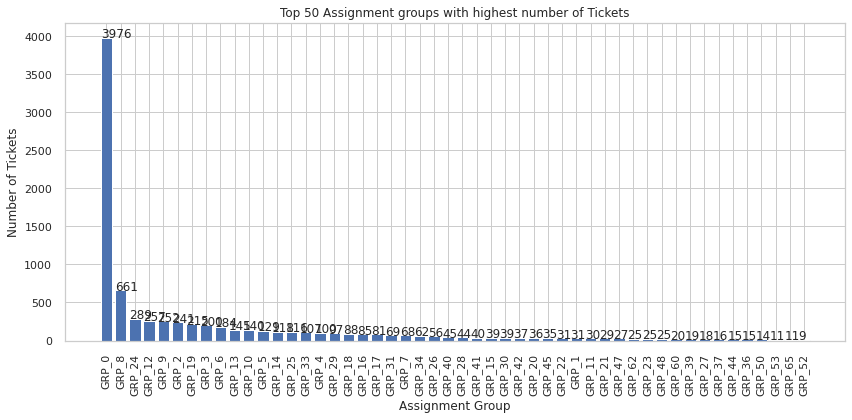

In [54]:
plt.figure(figsize=(12,6))
bars = plt.bar(df_top_50['index'],df_top_50['Assignment group'])
plt.title('Top 50 Assignment groups with highest number of Tickets')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()

In [55]:
df_bottom_50 = df['Assignment group'].value_counts().nsmallest(50).reset_index()

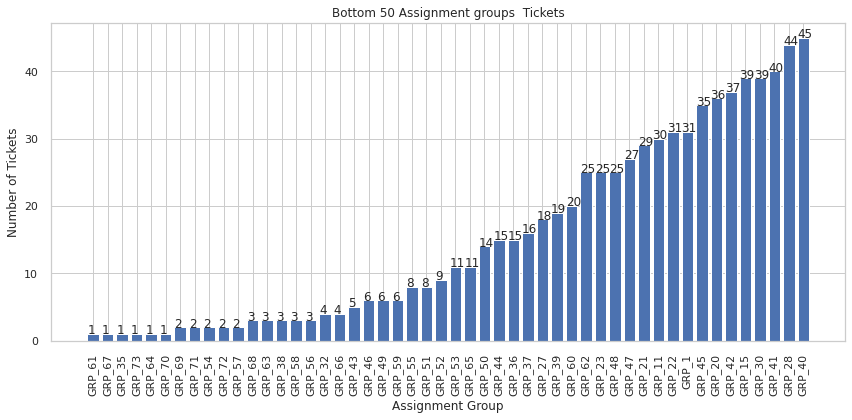

In [56]:
plt.figure(figsize=(12,6))
bars = plt.bar(df_bottom_50['index'],df_bottom_50['Assignment group'])
plt.title('Bottom 50 Assignment groups  Tickets')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()


Word Cloud plotting

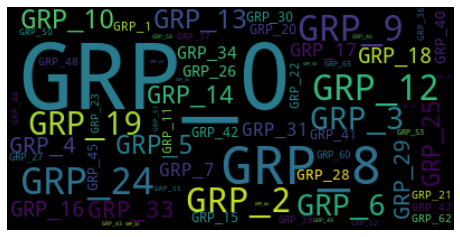

In [57]:
wordcloud_group(df["Assignment group"])



The visualization shows  it has high imbalance and group 0 is most frequent group

##2.Caller column exploration with plot for multiple groups for top 10 caler

Print Frequency of Top 10  callers

In [59]:
newcallerdf=df['Caller'].value_counts()[:10]
Callerdata = df['Caller'].value_counts().rename_axis('groupname').reset_index(name='counts')[:10]
print (Callerdata)
import matplotlib.pyplot as plt

           groupname  counts
0  bpctwhsn kzqsbmtp     810
1  ZkBogxib QsEJzdZO     151
2  fumkcsji sarmtlhy     134
3  rbozivdq gmlhrtvp      87
4  rkupnshb gsmzfojw      71
5  jloygrwh acvztedi      64
6  spxqmiry zpwgoqju      63
7  oldrctiu bxurpsyi      57
8  olckhmvx pcqobjnd      54
9  jyoqwxhz clhxsoqy      51


Plot Top 10 caller

Text(0.5, 1.0, 'Caller Group Distribution')

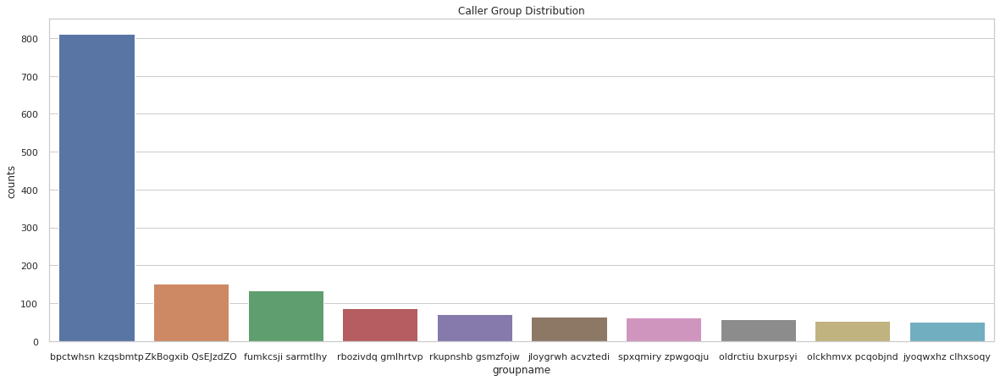

In [60]:

fig = plt.figure(figsize =(20, 7)) 
sns.barplot(x="groupname", y="counts", data=Callerdata)
plt.title("Caller Group Distribution")

Plot top 10 caller pie chart distribution with group to see most frequent group for top callers

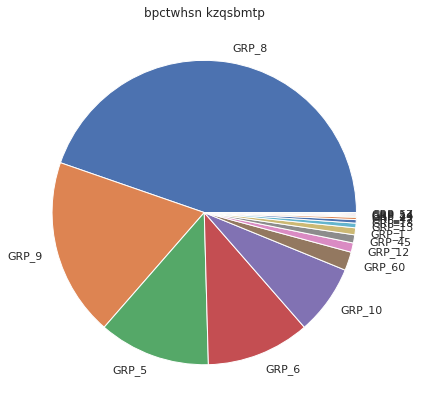

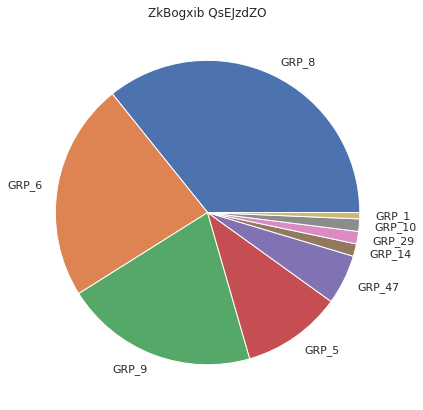

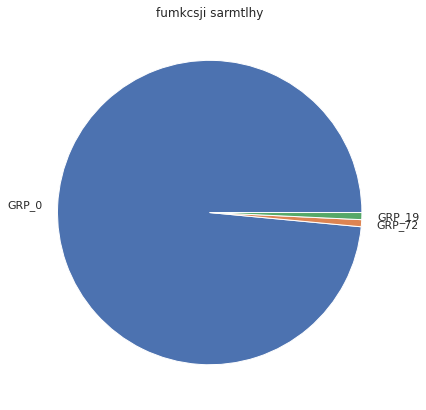

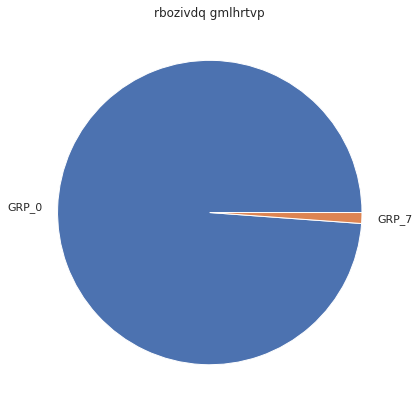

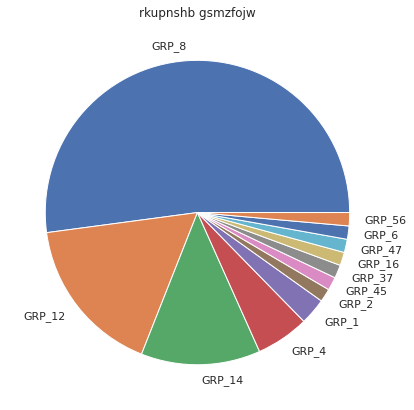

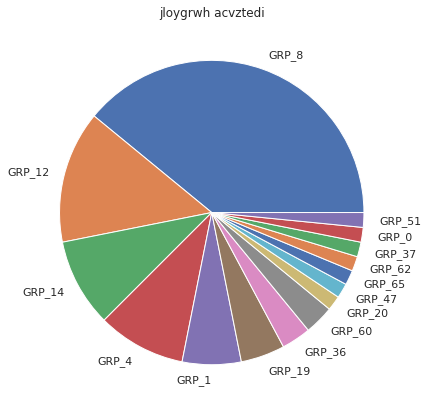

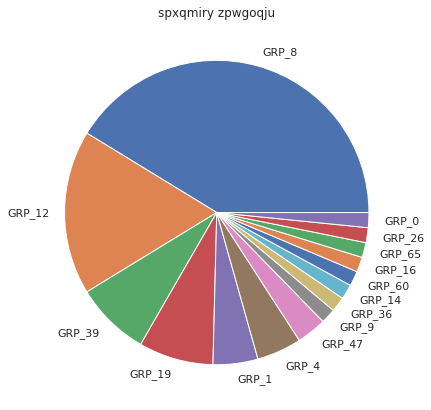

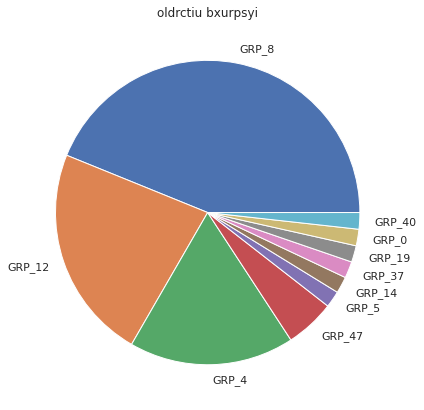

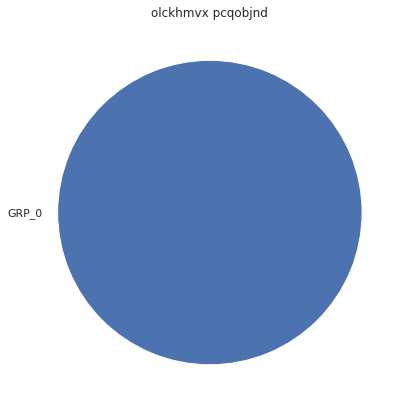

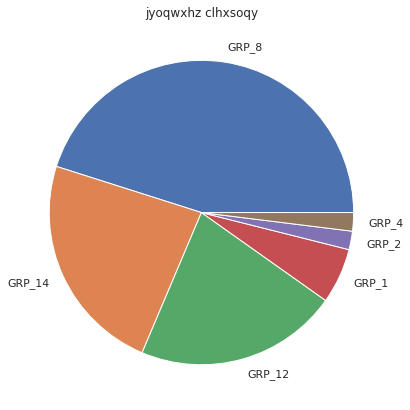

In [61]:
for x in Callerdata.groupname:
  callerdf=df.loc[df['Caller'] == x]
  grpdata = callerdf['Assignment group'].value_counts().rename_axis('groupnam').reset_index(name='counts')
  fig = plt.figure(figsize =(10, 7)) 
  plt.pie(grpdata['counts'], labels = grpdata['groupnam']) 
  plt.title(x)
  
  plt.show()

Observation:Here we can see that  group 8 has maximum no of callers

##3.Max word and min word and plot of word distribution for description and hort description column

In [62]:
df_word_char=df.copy(deep=False)
df_word_char['word_count'] = df_word_char['Description'].apply(lambda x: len(str(x).split(" ")))
df_word_char[['Description','word_count']].head()


,Description,word_count
0,-verified user details.(employee# & manager na...,29
1,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,23
2,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,9
3,unable to access hr_tool page,5
4,skype error,3


In [63]:
print(df_word_char['word_count'].max())
print(df_word_char['word_count'].min())


1417
1


In [64]:
df_word_char['word_count'].iplot(
    kind='hist',
    xTitle='word_count',
    linecolor='black',
    yTitle='count',
    title='Word Description Distribution')

In [65]:
df_word_char['word_countshort'] = df_word_char['Short description'].apply(lambda x: len(str(x).split(" ")))
df_word_char[['Short description','word_countshort']].head()

,Short description,word_countshort
0,login issue,2
1,outlook,1
2,cant log in to vpn,5
3,unable to access hr_tool page,5
4,skype error,3


In [66]:
print(df_word_char['word_countshort'].max())
print(df_word_char['word_countshort'].min())

41
1


In [67]:
df_word_char['word_countshort'].iplot(
    kind='hist',
    xTitle='word_count',
    linecolor='black',
    yTitle='count',
    title='Word short description Distribution')

Observation:The length of the description is highly imbalanced

##Block4:Dealing with missing values

In [68]:
newdf=df.copy(deep=False)

In [69]:
newdf["Short description"]=newdf["Short description"].fillna('The')
newdf["Description"]=newdf["Description"].fillna('The')
newdf["Summary"] = newdf["Short description"] +' '+newdf["Description"]
newdf.head(2)

,Short description,Description,Caller,Assignment group,Summary
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,login issue -verified user details.(employee# ...
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,outlook \r\n\r\nreceived from: hmjdrvpb.komuay...


In [70]:
print(newdf.shape)

print(newdf.isnull().sum())

(8500, 5)
Short description    0
Description          0
Caller               0
Assignment group     0
Summary              0
dtype: int64


In [71]:
newdf[4395:4396]

,Short description,Description,Caller,Assignment group,Summary
4395,i am locked out of skype,The,viyglzfo ajtfzpkb,GRP_0,i am locked out of skype The


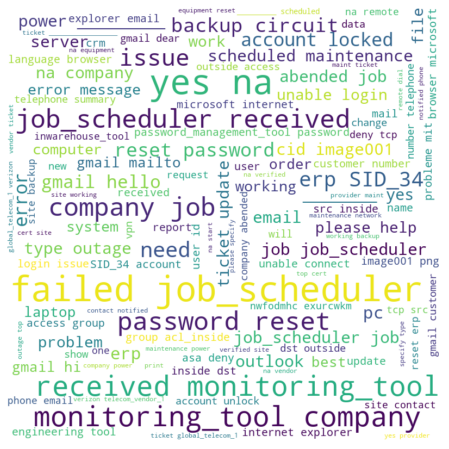

In [72]:
wordcloud_plot(newdf["Summary"])

(-0.5, 1599.5, 799.5, -0.5)

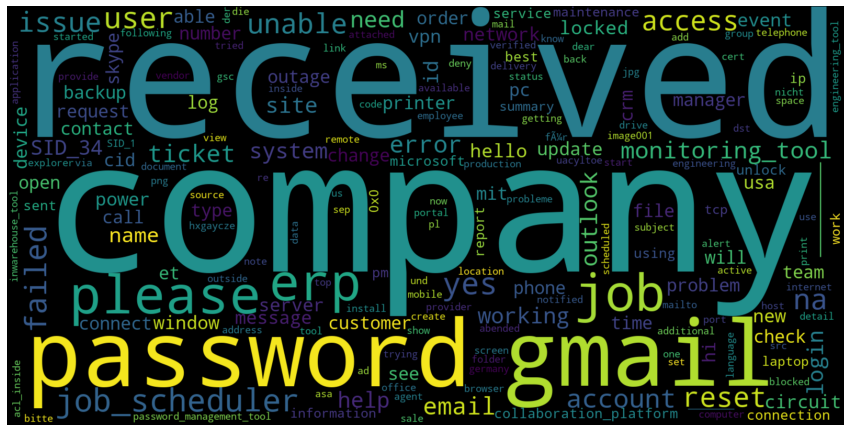

In [73]:
plt.figure(figsize = (15,15)) 
wc = WordCloud(width = 1600 , height = 800,collocations=False).generate(" ".join(w for w in newdf.Summary))
plt.imshow(wc , interpolation = 'bilinear')
plt.axis("off")

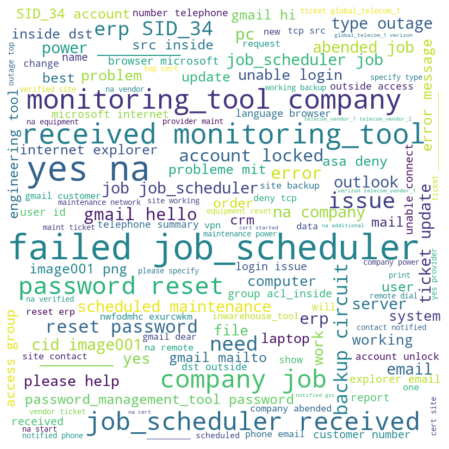

In [74]:
wordcloud_plot_stop(newdf["Summary"])

##Observation:Block4:
We have decided to take a combine column which will combine both short description and description.For this to handle the missing values we have concatinated with The in place of missing values which we will remove with the help of stop word.
We can also see the word cloud is messy and stop words have great impact on it.Moreover if we observe carefully we can see there are words with non english languages.So this gives a good visualization

##Block:5:Finding inconsistencies in the data:

We will try lang detect and polyglot library and will see language accuracy.

##Lang Detect

In [75]:
newcleaneddf=newdf.copy(deep=False)

In [76]:
newdf['language1'] = newdf['Summary'].apply(fn_lan_detect)

In [77]:
newdf["language1"].value_counts()

en    7058
de     382
af     264
it     130
fr     125
sv      83
nl      77
no      75
da      67
ca      50
es      47
pl      30
pt      27
tl      15
cy      14
ro      10
sq      10
hr       5
sl       5
fi       5
tr       4
id       4
et       4
cs       3
lt       2
lv       1
so       1
hu       1
sk       1
Name: language1, dtype: int64

In [78]:
newdf=newdf.drop(["language1"], axis=1)


##Polyglot language detection

In [79]:
newdf["lang"] = newdf["Summary"].apply(get_language)

Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

In [80]:
newdf["lang"].value_counts()

English              7935
German                401
Danish                 43
un                     28
Latin                  12
Portuguese             10
Hungarian               8
Waray                   7
Nauru                   6
Scots                   5
Polish                  5
Luxembourgish           5
Uzbek                   3
Dutch                   3
Zhuang                  3
Interlingua             2
Kinyarwanda             2
Ganda                   2
Norwegian               2
Scottish Gaelic         2
Spanish                 2
Finnish                 1
Catalan                 1
Icelandic               1
Maltese                 1
Latvian                 1
Tsonga                  1
Galician                1
Irish                   1
Norwegian Nynorsk       1
Welsh                   1
Estonian                1
Tagalog                 1
French                  1
Malay                   1
Name: lang, dtype: int64

In [81]:
def text_preprocessing_forlangdetect(text):
    strText = str(text)
    cleanText = cleantext_lower(text)
    cleanText = cleantext_removeHTML(cleanText)
    cleanText = removeAccentedChars(cleanText)
    cleanText = re.sub(r'\S*@\S*\s?', '', cleanText)
    cleanText = cleantext_remove_punctuation(cleanText)
    cleanText = cleantext_removeSpecialChars(cleanText)
    return cleanText

In [82]:
newcleaneddf["cleanedsummary"]=newcleaneddf["Summary"].apply(text_preprocessing_forlangdetect)

In [83]:
newcleaneddf['language1'] = newcleaneddf['cleanedsummary'].apply(fn_lan_detect)


In [84]:
newcleaneddf["language1"].value_counts()

en    7077
de     371
af     278
it     125
fr     102
no      70
nl      70
ca      66
cy      59
da      55
es      54
sv      50
pl      31
pt      30
sl      10
ro      10
tl       9
sq       7
hr       6
hu       5
id       4
fi       4
et       3
lt       2
cs       1
so       1
Name: language1, dtype: int64

In [85]:
newcleaneddf["lang"] = newcleaneddf["cleanedsummary"].apply(get_language)


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

In [86]:
newcleaneddf["lang"].value_counts()

English              7885
German                398
Danish                 40
un                     28
Tongan                 24
Portuguese             13
Hawaiian               11
Latin                  10
Hungarian               9
Scots                   8
Dutch                   6
Luxembourgish           6
Nauru                   6
Welsh                   5
Polish                  5
Maltese                 4
Uzbek                   3
Icelandic               3
Zhuang                  3
Kinyarwanda             2
Norwegian               2
Breton                  2
Waray                   2
Scottish Gaelic         2
Spanish                 2
Interlingua             2
Ganda                   2
Samoan                  2
Zulu                    1
French                  1
Finnish                 1
Haitian Creole          1
Catalan                 1
Romansh                 1
Turkish                 1
Manx                    1
Latvian                 1
Galician                1
Norwegian Ny

What we observed that polyglot gives more accuracy so we will go with it.Now we have 7900+ english rows for polyglot where as for langdetect it is giving 7000+

In [87]:
newdf.head(10)

,Short description,Description,Caller,Assignment group,Summary,lang
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,login issue -verified user details.(employee# ...,English
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,outlook \r\n\r\nreceived from: hmjdrvpb.komuay...,English
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0,cant log in to vpn \r\n\r\nreceived from: eylq...,English
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page unable to access...,English
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error,Latin
5,unable to log in to engineering tool and skype,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0,unable to log in to engineering tool and skype...,English
6,event: critical:HostName_221.company.com the v...,event: critical:HostName_221.company.com the v...,jyoqwxhz clhxsoqy,GRP_1,event: critical:HostName_221.company.com the v...,English
7,ticket_no1550391- employment status - new non-...,ticket_no1550391- employment status - new non-...,eqzibjhw ymebpoih,GRP_0,ticket_no1550391- employment status - new non-...,English
8,unable to disable add ins on outlook,unable to disable add ins on outlook,mdbegvct dbvichlg,GRP_0,unable to disable add ins on outlook unable to...,English
9,ticket update on inplant_874773,ticket update on inplant_874773,fumkcsji sarmtlhy,GRP_0,ticket update on inplant_874773 ticket update ...,English


###We will divide the dataset to two part one with having rows with english language and one with non english languages.

In [88]:

def fn_translate(newdf):
  if newdf['lang'] == "English":
    engdf=newdf
    return engdf
  else:
    nonengdf=newdf
    return nonengdf
newdf.apply(fn_translate, axis = 1)   

,Short description,Description,Caller,Assignment group,Summary,lang
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,login issue -verified user details.(employee# ...,English
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,outlook \r\n\r\nreceived from: hmjdrvpb.komuay...,English
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0,cant log in to vpn \r\n\r\nreceived from: eylq...,English
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page unable to access...,English
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error,Latin
5,unable to log in to engineering tool and skype,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0,unable to log in to engineering tool and skype...,English
6,event: critical:HostName_221.company.com the v...,event: critical:HostName_221.company.com the v...,jyoqwxhz clhxsoqy,GRP_1,event: critical:HostName_221.company.com the v...,English
7,ticket_no1550391- employment status - new non-...,ticket_no1550391- employment status - new non-...,eqzibjhw ymebpoih,GRP_0,ticket_no1550391- employment status - new non-...,English
8,unable to disable add ins on outlook,unable to disable add ins on outlook,mdbegvct dbvichlg,GRP_0,unable to disable add ins on outlook unable to...,English
9,ticket update on inplant_874773,ticket update on inplant_874773,fumkcsji sarmtlhy,GRP_0,ticket update on inplant_874773 ticket update ...,English


In [89]:
engdf = newdf[(newdf['lang'] == "English")]
nonengdf = newdf[(newdf['lang'] != "English")]

In [90]:
nonengdf.head(5)

,Short description,Description,Caller,Assignment group,Summary,lang
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0,skype error skype error,Latin
146,erp_print_tool install.,erp_print_tool install.,aorthyme rnsuipbk,GRP_0,erp_print_tool install. erp_print_tool install.,Kinyarwanda
148,install acrobat standard,install acrobat standard,iefgkray zdyksvpw,GRP_0,install acrobat standard install acrobat standard,Malay
223,probleme mit bluescreen .,"hallo ,\n\nes ist erneut passiert. der pc hat ...",vrfpyjwi nzhvgqiw,GRP_24,"probleme mit bluescreen . hallo ,\n\nes ist er...",German
251,reset the password for fygrwuna gomcekzi on e-...,bitte passwort fÃ¼r fygrwuna gomcekzi e-mail z...,fygrwuna gomcekzi,GRP_0,reset the password for fygrwuna gomcekzi on e-...,German


###We will apply Google translation on non english rows and merge the non english part with english part and create final feature column 

In [91]:


translator = Translator()

nonengdf["newsummary"] = nonengdf["Summary"].map(lambda x: translator.translate(x).text)

In [92]:
engdf["newsummary"]=engdf["Summary"]
finalsummary=pd.merge(engdf, nonengdf, how='outer')
finalsummary.head(5)

,Short description,Description,Caller,Assignment group,Summary,lang,newsummary
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,login issue -verified user details.(employee# ...,English,login issue -verified user details.(employee# ...
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,outlook \r\n\r\nreceived from: hmjdrvpb.komuay...,English,outlook \r\n\r\nreceived from: hmjdrvpb.komuay...
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0,cant log in to vpn \r\n\r\nreceived from: eylq...,English,cant log in to vpn \r\n\r\nreceived from: eylq...
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page unable to access...,English,unable to access hr_tool page unable to access...
4,unable to log in to engineering tool and skype,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0,unable to log in to engineering tool and skype...,English,unable to log in to engineering tool and skype...


In [93]:
print(finalsummary.shape)

print(finalsummary.isnull().sum())
finalticketsummary=finalsummary.drop(["lang"], axis=1)
#Shape and search for NA values

(8500, 7)
Short description    0
Description          0
Caller               0
Assignment group     0
Summary              0
lang                 0
newsummary           0
dtype: int64


In [94]:
finalticketsummary["lang1"] = finalticketsummary["newsummary"].apply(get_language)


Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to detect the language reliably.
Detector is not able to dete

###We will check language accuracy after translation

In [95]:
print(finalticketsummary["lang1"].value_counts())

English              8274
German                111
un                     28
Danish                 17
Latin                   9
Portuguese              7
Nauru                   6
Hungarian               5
Waray                   5
Scots                   4
Polish                  4
Uzbek                   3
Ganda                   2
Interlingua             2
Kinyarwanda             2
Zhuang                  2
Norwegian               2
Scottish Gaelic         2
Maltese                 1
Finnish                 1
Catalan                 1
Latvian                 1
Luxembourgish           1
Tsonga                  1
Galician                1
Irish                   1
Norwegian Nynorsk       1
Welsh                   1
Estonian                1
Dutch                   1
Tagalog                 1
French                  1
Malay                   1
Name: lang1, dtype: int64


In [96]:
finalticketsummary.loc[finalticketsummary["lang1"]=="French"]

,Short description,Description,Caller,Assignment group,Summary,newsummary,lang1
8322,email delegation,email delegation,wbtrvdsi gdbuvszx,GRP_0,email delegation email delegation,email delegation email delegation,French


In [97]:
finalticketsummary=finalticketsummary.drop(["lang1"], axis=1)


##Observation:
1.For language detection we observed that the detection works better for unprocessed text rather than processed text.

2.The polyglot works better in terms of language accuracy with 7928+ english rows detection where as for lang detect it is 7069.

2.After translation 8300+ rows got translated and out of rest 70% is in english but due to some name it is detected as non english.So we are good to go and we will start doing further visualization and text processing

##Block:6:Visualizing different text features:

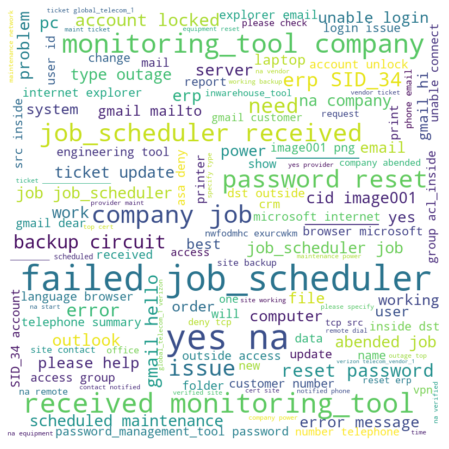

In [98]:
wordcloud_plot(finalticketsummary["newsummary"])

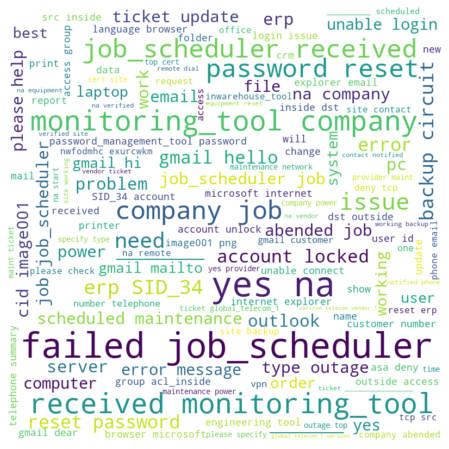

In [99]:
wordcloud_plot_stop(finalticketsummary["newsummary"])

##Calculate top 50 frequent words

In [100]:
from collections import Counter
Counter(" ".join(finalticketsummary["newsummary"]).split()).most_common(50)

[('to', 8560),
 ('the', 7399),
 ('in', 4960),
 ('is', 3662),
 ('on', 2966),
 ('not', 2950),
 ('and', 2869),
 ('for', 2758),
 ('from:', 2499),
 ('i', 2460),
 ('received', 2386),
 ('a', 2075),
 ('please', 2066),
 ('job', 1976),
 ('of', 1939),
 ('password', 1893),
 ('erp', 1830),
 ('failed', 1704),
 ('job_scheduler', 1629),
 ('at:', 1614),
 ('(yes/no/na)', 1566),
 ('?', 1562),
 ('this', 1506),
 ('unable', 1484),
 ('-', 1442),
 ('it', 1424),
 ('reset', 1385),
 ('with', 1328),
 ('user', 1227),
 ('my', 1190),
 ('account', 1136),
 ('from', 1121),
 ('access', 1111),
 ('you', 1105),
 ('have', 1070),
 (':', 1050),
 ('monitoring_tool@company.com', 961),
 ('at', 915),
 ('company', 913),
 ('are', 908),
 ('issue', 899),
 ('be', 864),
 ('error', 863),
 ('that', 835),
 ('can', 826),
 ('am', 801),
 ('outlook', 795),
 ('ticket', 787),
 ('login', 755),
 ('site', 755)]

##Observation:Block6:

What we observed that:The word cloud gets better and also there is very few non english words but most frequent words are still coming as stop words.So we need to apply preprocessing and remove stop word.

##Block7:Text preprocessing:


###We have created one common function for text processing later if anything required we can add there.

In [101]:
def text_preprocessing(text):
    strText = str(text)
    cleanText=removeDuplicates(text)
    cleanText = cleantext_removeHTML(cleanText)
    cleanText = re.sub(r'\d+', '', cleanText)
    cleanText = cleantext_remove_url(cleanText)
    cleanText = re.sub(r'\S*@\S*\s?', '', cleanText)
    cleantext = re.sub(r'https?:\/\/.\/\w', '', cleanText)  
    cleanText = cleantext_lower(cleanText)
       
    #cleanText = removeAccentedChars(cleanText)
    cleanText = expandContractions(cleanText)
    cleanText = cleantext_remove_punctuation(cleanText)
    
    cleanText = cleantext_removeSpecialChars(cleanText)
    cleantext = re.sub(r'\n',' ',cleanText)
    
    
    cleanText = re.sub(r'[^a-zA-Z\s]',' ',cleanText) 
    cleanText = re.sub(r'\s+',' ',cleanText)
    cleanText = cleantext_textLemmatize(cleanText)
    return cleanText

In [102]:
finalticketsummary["cleanedsummary"]=finalticketsummary["newsummary"].apply(text_preprocessing)

In [103]:
finalticketsummary["cleanedsummary"].head(53)

0     login issue verify user detail employee manage...
1     outlook receive from hello team my meeting sky...
2     can not log in to vpn receive from hi i can no...
3                         unable to access hr tool page
4           unable to log in engineering tool and skype
5     event critical hostname company com the value ...
6     ticket no employment status new non employee e...
7                   unable to disable add in on outlook
8                              ticket update on inplant
9     engineering tool say not connect and unable to...
10                 hr tool site not load page correctly
11     unable to login hr tool sgxqsuojr xwbesorf cards
12                      user want to reset the password
13                               unable to open payslip
14                             ticket update on inplant
15    unable to login company vpn receive from hi i ...
16          when undocking pc screen will not come back
17                                 erp sid accou

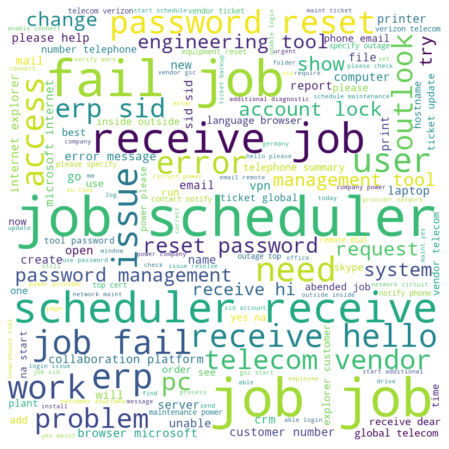

In [104]:
wordcloud_plot(finalticketsummary["cleanedsummary"])

In [106]:
from collections import Counter
Counter(" ".join(finalticketsummary["cleanedsummary"]).split()).most_common(50)

[('be', 5048),
 ('to', 3679),
 ('job', 3386),
 ('from', 3208),
 ('in', 3010),
 ('the', 2881),
 ('not', 2574),
 ('receive', 2517),
 ('i', 2154),
 ('please', 1977),
 ('on', 1708),
 ('and', 1637),
 ('for', 1597),
 ('have', 1596),
 ('a', 1580),
 ('password', 1493),
 ('at', 1479),
 ('no', 1356),
 ('it', 1349),
 ('tool', 1249),
 ('issue', 1223),
 ('erp', 1216),
 ('do', 1202),
 ('can', 1176),
 ('company', 1136),
 ('user', 1123),
 ('of', 1099),
 ('this', 1034),
 ('sid', 1014),
 ('work', 1004),
 ('with', 1000),
 ('reset', 989),
 ('scheduler', 970),
 ('fail', 941),
 ('ticket', 916),
 ('unable', 888),
 ('you', 874),
 ('error', 860),
 ('my', 846),
 ('access', 824),
 ('need', 762),
 ('account', 756),
 ('hello', 702),
 ('help', 690),
 ('system', 683),
 ('email', 679),
 ('that', 641),
 ('when', 634),
 ('get', 633),
 ('we', 624)]

##Observation Block7:
When we have applied preprocessing we get a better word cloud with out special character and the words are lemmatized like failed instead of fail

##Block:8:Creating tokens as required

In [107]:
def clean_tokenization(text):
  return word_tokenize(text)
finalticketsummary["tokenizesummary"]=finalticketsummary["cleanedsummary"].apply(clean_tokenization)
finalticketsummary["tokenizesummary"].head(10)

0    [login, issue, verify, user, detail, employee,...
1    [outlook, receive, from, hello, team, my, meet...
2    [can, not, log, in, to, vpn, receive, from, hi...
3                 [unable, to, access, hr, tool, page]
4    [unable, to, log, in, engineering, tool, and, ...
5    [event, critical, hostname, company, com, the,...
6    [ticket, no, employment, status, new, non, emp...
7          [unable, to, disable, add, in, on, outlook]
8                        [ticket, update, on, inplant]
9    [engineering, tool, say, not, connect, and, un...
Name: tokenizesummary, dtype: object

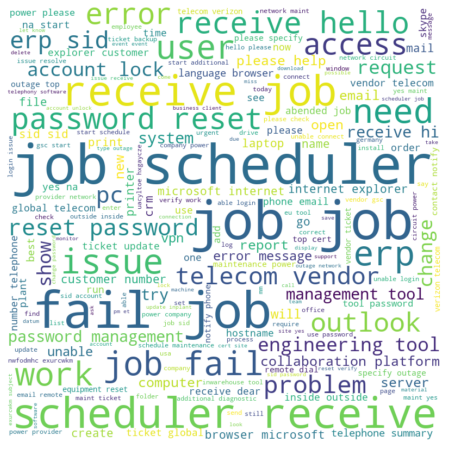

In [108]:
wordcloud_spam = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                     min_font_size = 10).generate_from_text(' '.join(word for w in finalticketsummary["tokenizesummary"] for word in w))

# Lines 2 - 5
plt.figure(figsize = (8,8))
plt.imshow(wordcloud_spam, interpolation='bilinear')
plt.axis("off")
plt.show()

In [109]:

result = set(stopwords.words('english'))
print("List of stopwords in English:")
print(result)


List of stopwords in English:
{'about', 'has', "don't", 'ain', "weren't", 'but', 'its', "shan't", 'him', 'her', 'those', 'had', 'into', 'when', 'haven', 'how', 'out', "hadn't", 'after', 'nor', 'be', 'this', "won't", 'if', 'each', "mightn't", 'can', 'against', 'any', 'does', 'their', 'under', 'mightn', "mustn't", 'below', 'theirs', 'ourselves', 'y', 'mustn', 'is', 'you', 'which', 'as', 'too', 'ours', 'o', 'me', 'they', 'there', 'been', 'your', 'and', 't', 'them', 'm', "didn't", 'hasn', 'than', 'between', "couldn't", "should've", 'no', 'very', 'more', 'until', 'was', 'up', 'having', 'only', "wouldn't", 'down', 'hers', 'once', 's', 'will', 'of', 'again', 'ma', 'an', "shouldn't", 'shouldn', "hasn't", 'd', 'i', 'all', "you'll", 'wouldn', "you're", "you'd", 'were', 'on', 'll', 've', 'my', 'to', 'we', 'because', 'from', 'other', 'herself', 'at', 'a', 'while', 'same', 'what', 'am', 'do', 'should', 'won', 'where', 'before', 'our', 'who', 'doesn', "haven't", 'his', 'some', 'myself', 'needn', 'is

In [110]:
stop_words = set(stopwords.words('english')) - set(["hadn't", "didn't", "shouldn't","shan't","hasn't","don't","needn't","won't","couldn't","doesn't","haven't","mustn't","nor","mightn't","weren't","isn't","wasn't","not","no","wouldn't","aren't"])
print("\nList of fresh stopwords in English:")
print(stop_words)

stop_words.add("e")
stop_words.add("f")
print(stop_words)


List of fresh stopwords in English:
{'about', 'has', 'ain', 'but', 'its', 'him', 'her', 'those', 'had', 'into', 'when', 'haven', 'how', 'out', 'after', 'be', 'this', 'if', 'each', 'can', 'against', 'any', 'does', 'their', 'under', 'mightn', 'below', 'theirs', 'ourselves', 'y', 'mustn', 'is', 'you', 'which', 'as', 'too', 'ours', 'o', 'me', 'they', 'there', 'been', 'your', 'and', 't', 'them', 'm', 'hasn', 'than', 'between', "should've", 'very', 'more', 'until', 'was', 'up', 'having', 'only', 'down', 'hers', 'once', 's', 'will', 'of', 'again', 'ma', 'an', 'shouldn', 'd', 'i', 'all', "you'll", 'wouldn', "you're", "you'd", 'were', 'on', 'll', 've', 'my', 'to', 'we', 'because', 'from', 'other', 'herself', 'at', 'a', 'while', 'same', 'what', 'am', 'do', 'should', 'won', 'where', 'before', 'our', 'who', 'doesn', 'his', 'some', 'myself', 'needn', 'isn', 'have', 'then', 'she', 'don', 'these', 'he', 'did', 'off', 'by', 'during', 'hadn', 'above', 'weren', 're', 'yours', 'it', 'with', 'yourself', 

In [111]:
#STOPWORDS = set(stopwords.words('english'))
def remove_stopwords(text):
    """custom function to remove the stopwords"""
    return " ".join([word for word in str(text).split() if word not in stop_words])

finalticketsummary["CleanTextAfterRemoveStopword"] = finalticketsummary["cleanedsummary"].apply(lambda text: remove_stopwords(text))
finalticketsummary["CleanTextAfterRemoveStopword"].head()

0    login issue verify user detail employee manage...
1    outlook receive hello team meeting skype meeti...
2                  not log vpn receive hi not vpn best
3                           unable access hr tool page
4                    unable log engineering tool skype
Name: CleanTextAfterRemoveStopword, dtype: object

In [112]:
finalticketsummary["tokenizesummaryafterstopword"]=finalticketsummary["CleanTextAfterRemoveStopword"].apply(clean_tokenization)

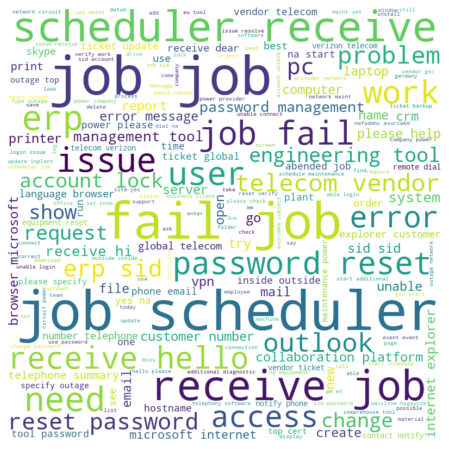

In [113]:
wordcloud_spam = WordCloud(width = 800, height = 800, 
                    background_color ='white', 
                     min_font_size = 10).generate_from_text(' '.join(word for w in finalticketsummary["tokenizesummaryafterstopword"] for word in w))

# Lines 2 - 5
plt.figure(figsize = (8,8))
plt.imshow(wordcloud_spam, interpolation='bilinear')
plt.axis("off")
plt.show()

In [114]:
Counter(" ".join(finalticketsummary["CleanTextAfterRemoveStopword"]).split()).most_common(50)

[('job', 3386),
 ('not', 2574),
 ('receive', 2517),
 ('please', 1977),
 ('password', 1493),
 ('no', 1356),
 ('tool', 1249),
 ('issue', 1223),
 ('erp', 1216),
 ('company', 1136),
 ('user', 1123),
 ('sid', 1014),
 ('work', 1004),
 ('reset', 989),
 ('scheduler', 970),
 ('fail', 941),
 ('ticket', 916),
 ('unable', 888),
 ('error', 860),
 ('access', 824),
 ('need', 762),
 ('account', 756),
 ('hello', 702),
 ('help', 690),
 ('system', 683),
 ('email', 679),
 ('get', 633),
 ('name', 617),
 ('network', 605),
 ('hostname', 597),
 ('would', 588),
 ('yes', 586),
 ('outlook', 571),
 ('use', 571),
 ('vendor', 567),
 ('login', 533),
 ('na', 505),
 ('message', 502),
 ('power', 502),
 ('see', 484),
 ('telecom', 479),
 ('update', 472),
 ('change', 450),
 ('check', 441),
 ('start', 435),
 ('event', 426),
 ('phone', 426),
 ('try', 422),
 ('team', 421),
 ('send', 420)]

(-0.5, 1599.5, 799.5, -0.5)

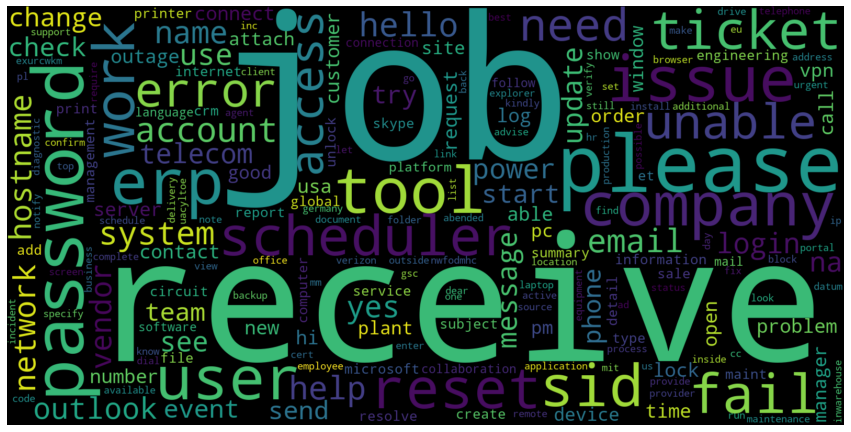

In [115]:
plt.figure(figsize = (15,15)) 
wc = WordCloud(width = 1600 , height = 800,collocations=False).generate(" ".join(w for w in finalticketsummary.CleanTextAfterRemoveStopword))
plt.imshow(wc , interpolation = 'bilinear')
plt.axis("off")

In [116]:
finalticketsummary.head()

,Short description,Description,Caller,Assignment group,Summary,newsummary,cleanedsummary,tokenizesummary,CleanTextAfterRemoveStopword,tokenizesummaryafterstopword
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0,login issue -verified user details.(employee# ...,login issue -verified user details.(employee# ...,login issue verify user detail employee manage...,"[login, issue, verify, user, detail, employee,...",login issue verify user detail employee manage...,"[login, issue, verify, user, detail, employee,..."
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0,outlook \r\n\r\nreceived from: hmjdrvpb.komuay...,outlook \r\n\r\nreceived from: hmjdrvpb.komuay...,outlook receive from hello team my meeting sky...,"[outlook, receive, from, hello, team, my, meet...",outlook receive hello team meeting skype meeti...,"[outlook, receive, hello, team, meeting, skype..."
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0,cant log in to vpn \r\n\r\nreceived from: eylq...,cant log in to vpn \r\n\r\nreceived from: eylq...,can not log in to vpn receive from hi i can no...,"[can, not, log, in, to, vpn, receive, from, hi...",not log vpn receive hi not vpn best,"[not, log, vpn, receive, hi, not, vpn, best]"
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0,unable to access hr_tool page unable to access...,unable to access hr_tool page unable to access...,unable to access hr tool page,"[unable, to, access, hr, tool, page]",unable access hr tool page,"[unable, access, hr, tool, page]"
4,unable to log in to engineering tool and skype,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0,unable to log in to engineering tool and skype...,unable to log in to engineering tool and skype...,unable to log in engineering tool and skype,"[unable, to, log, in, engineering, tool, and, ...",unable log engineering tool skype,"[unable, log, engineering, tool, skype]"


In [117]:
finalticketsummary=finalticketsummary.drop(["Short description","Description","Summary","cleanedsummary","tokenizesummary","newsummary","Caller"], axis=1)
finalticketsummary.head()

,Assignment group,CleanTextAfterRemoveStopword,tokenizesummaryafterstopword
0,GRP_0,login issue verify user detail employee manage...,"[login, issue, verify, user, detail, employee,..."
1,GRP_0,outlook receive hello team meeting skype meeti...,"[outlook, receive, hello, team, meeting, skype..."
2,GRP_0,not log vpn receive hi not vpn best,"[not, log, vpn, receive, hi, not, vpn, best]"
3,GRP_0,unable access hr tool page,"[unable, access, hr, tool, page]"
4,GRP_0,unable log engineering tool skype,"[unable, log, engineering, tool, skype]"


##Observation Block8:

We have tokenized the cleaned text and removed the stopword.Our final feature is ready now and the frequent words values have a significant change and also the word cloud is more prominent.Now we are good to go for embedding

#Part 2

#**Model Building**



###**9.Featurization**

1.Try TFIDF and Count vectorizaer and apply transformed input to different conventional Machine Learning models

2.Build Vocabulary.

3.Convert the target column to label encoded output

###**10.Building a model architecture which can classify.**
1.Creation of a common function on model building with al the performence metrices 

2.Test Train Split

###**11.Trying different model architectures by researching state of the art for similar tasks.**

1.Try multiple models for transformed input with Count vectorizer and compare their performence.Plot Accuracy,Precision F1 score and  Recall comparison plot for different models.

2.Try multiple models for transformed input with TFIDF vectorizer and compare their performence.Plot Accuracy,Precision F1 score and  Recall comparison plot for different models.

3.Try multiple models for transformed input with Pipeline with Count then TIDF vectorizer and compare their performence.Plot Accuracy,Precision F1 score and  Recall comparison plot for different models.

4.Try glove for logistic regression and Random forest and compare their performence.

###**12.Create the deep learning base model.**

1.Building of basic model with one Embedding,LSTM and Dense layer without weight matrix to check the accuracy.

2.Building of basic model with one Embedding,LSTM and Dense layer with weight matrix to check the accuracy.

3.Plot validation and training losses.



###**Block 9:Featurization**

1.Try TFIDF and Count vectorizaer and apply transformed input to different conventional Machine Learning models

2.Build Vocabulary.

3.Convert the target column to label encoded output 

In [118]:

# label_encoder object knows how to understand word labels. 
label_encoder = preprocessing.LabelEncoder() 
# Encode labels in column 'species'. 
finalticketsummary['Assignment group_num']= label_encoder.fit_transform(finalticketsummary['Assignment group'])  
finalticketsummary['Assignment group_num'].tail()

8495    27
8496     0
8497    27
8498    24
8499    44
Name: Assignment group_num, dtype: int64

In [119]:
#Test train split
x_train_count, x_test_count, y_train_count, y_test_count = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"], finalticketsummary['Assignment group_num'], test_size=0.2,random_state=0)
                                                             
print(x_train_count.shape,x_test_count.shape)
print(y_train_count.shape,y_test_count.shape)

(6800,) (1700,)
(6800,) (1700,)


In [120]:
vectorizer = CountVectorizer()  
X_train_count = vectorizer.fit_transform(x_train_count)
X_train_count.shape

X_test_count = vectorizer.transform(x_test_count)
X_test_count.shape
X_train_count
#Count Vectorizer Transformation

<6800x10409 sparse matrix of type '<class 'numpy.int64'>'
	with 96898 stored elements in Compressed Sparse Row format>

In [121]:
count_tokens = vectorizer.get_feature_names()
print(count_tokens)

['aa', 'aaa', 'aacbcc', 'aacount', 'aae', 'aao', 'aaplant', 'ab', 'abandon', 'abap', 'abb', 'abbc', 'abc', 'abca', 'abd', 'abdhtyu', 'abend', 'abende', 'abended', 'aber', 'abertura', 'abgebildet', 'abgeschlossen', 'abgrtyreu', 'abhanden', 'abhay', 'abhilfe', 'abholen', 'ability', 'abl', 'able', 'abode', 'abort', 'aborted', 'aborting', 'abovementioned', 'abrechnung', 'abreu', 'abrurto', 'absence', 'absender', 'absent', 'absolutely', 'abstechprogramdntym', 'abwfnzwbnvbw', 'ac', 'acache', 'acbccb', 'acc', 'acccount', 'accdb', 'acce', 'accede', 'accept', 'acceptance', 'accesible', 'acceso', 'access', 'accessed', 'accessibility', 'accessible', 'accessing', 'accesss', 'accident', 'accidental', 'accidentally', 'accidently', 'accompany', 'accomplish', 'accont', 'accord', 'accordance', 'accordingly', 'accound', 'account', 'accountant', 'accounting', 'accounts', 'accout', 'accross', 'accrual', 'accse', 'accsess', 'acct', 'accuracy', 'accurate', 'acd', 'ace', 'acess', 'acessos', 'acgyuna', 'ache'

In [122]:
ch2 = SelectKBest(chi2, k=5000)
X_train_chi_count = ch2.fit_transform(X_train_count, y_train_count)
X_test_chi_count = ch2.transform(X_test_count)

X_train_chi_count, X_test_chi_count
#Selection of best features

(<6800x5000 sparse matrix of type '<class 'numpy.int64'>'
 	with 85403 stored elements in Compressed Sparse Row format>,
 <1700x5000 sparse matrix of type '<class 'numpy.int64'>'
 	with 19357 stored elements in Compressed Sparse Row format>)

Creation of Dataframe to compare the models

In [123]:

data = {'ModelName':['TrainAccuracy', 'TestAccuracy', 'PrecisionScore', 'RecallScore','F1Score']}
modecomparedf= pd.DataFrame(data)
modecomparedf

,ModelName
0,TrainAccuracy
1,TestAccuracy
2,PrecisionScore
3,RecallScore
4,F1Score


###Observations: Block 9:
1.Completed the count vectorizer transformation and created the transformed input to apply to model

2.Created the data frame to observe model comparison

3.Converted the target column to label encoded output

4.Also for selecting best features we have used chisquare method which gives a better accuracy

8.We have splitted the data to 80:20


###**10.Building a model architecture which can classify.**

###**11.Trying different model architectures by researching state of the art for similar tasks.**

1.Try multiple models for transformed input with Count vectorizer and compare their performence.Plot Accuracy,Precision F1 score and Recall comparison plot for different models.

In [124]:
mclf = MultinomialNB().fit(X_train_count, y_train_count)
data_m=predict_ml_model(mclf,X_train_chi_count,y_train_count,X_test_chi_count,y_test_count)
modecomparedf['MultinomialNB'] = data_m


accuracy 0.648235294117647
Training score: 70.79411764705881
Testing score: 64.8235294117647


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [125]:

rclf = RandomForestClassifier()
data_m=predict_ml_model(rclf,X_train_chi_count,y_train_count,X_test_chi_count,y_test_count)
modecomparedf['RandomForest'] = data_m


accuracy 0.6547058823529411
Training score: 94.6470588235294
Testing score: 65.47058823529412


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [126]:


sclf= SGDClassifier(loss='hinge', penalty='l2',alpha=1e-3, random_state=42, max_iter=5, tol=None)

sclf.fit(X_train_chi_count, y_train_count)



y_pred = sclf.predict(X_test_chi_count)

print('accuracy %s' % accuracy_score(y_pred, y_test_count))
print('Training score:',sclf.score(X_train_chi_count, y_train_count)*100)
print('Testing score:',sclf.score(X_test_chi_count,y_test_count)*100)


accuracy 0.6688235294117647
Training score: 81.92647058823529
Testing score: 66.88235294117646


In [127]:
sclf=LogisticRegression(n_jobs=1, C=1e5)
data_m=predict_ml_model(sclf,X_train_chi_count,y_train_count,X_test_chi_count,y_test_count)
modecomparedf['LogisticRegression'] = data_m


accuracy 0.66
Training score: 93.38235294117648
Testing score: 66.0


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [128]:
modecomparedf

,ModelName,MultinomialNB,RandomForest,LogisticRegression
0,TrainAccuracy,70.794118,94.647059,93.382353
1,TestAccuracy,64.823529,65.470588,66.000000
2,PrecisionScore,88.511853,86.463516,72.013489
3,RecallScore,64.823529,65.470588,66.000000
4,F1Score,73.237849,72.820043,68.282309


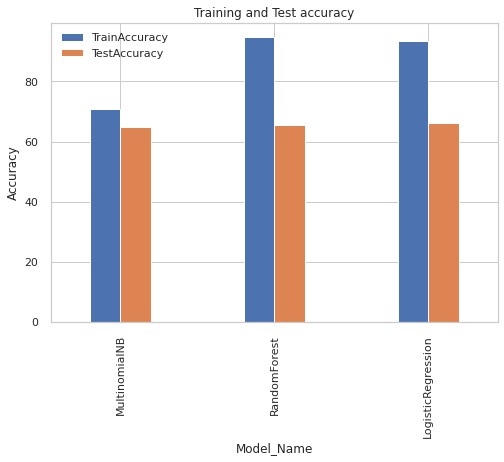

<Figure size 1080x720 with 0 Axes>

In [129]:
modecomparedf
modelCompare_countVect=modecomparedf.set_index('ModelName').rename_axis(None).T
modelCompare_countVect['Model_Name']=['MultinomialNB','RandomForest','LogisticRegression']
modelCompare_countVect
modelCompare_countVect.plot(kind='bar',x='Model_Name',y=['TrainAccuracy','TestAccuracy'], grid=True,width = 0.4)
plt.title('Training and Test accuracy')
plt.ylabel('Accuracy')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(15,10)) 

plt.show()

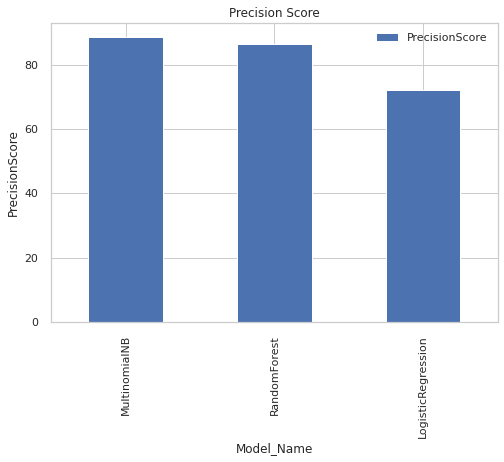

<Figure size 720x360 with 0 Axes>

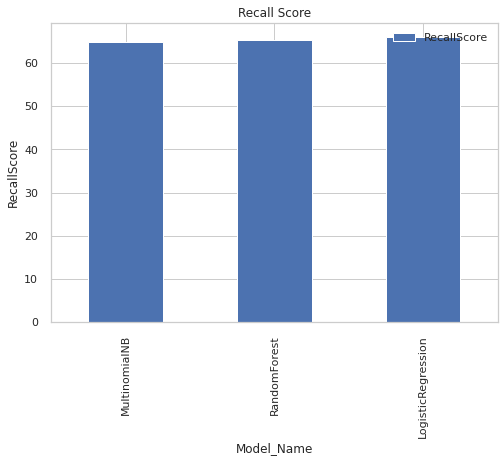

<Figure size 720x360 with 0 Axes>

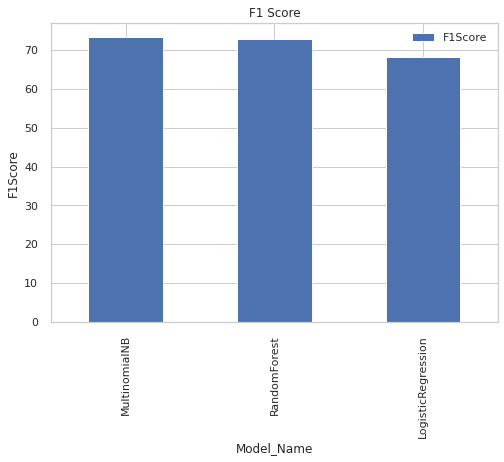

<Figure size 720x360 with 0 Axes>

In [130]:

modelCompare_countVect.plot(kind='bar',x='Model_Name',y='PrecisionScore', grid=True)
plt.title('Precision Score')
plt.ylabel('PrecisionScore')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

modelCompare_countVect.plot(kind='bar',x='Model_Name',y='RecallScore', grid=True)
plt.title('Recall Score')
plt.ylabel('RecallScore')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

modelCompare_countVect.plot(kind='bar',x='Model_Name',y='F1Score', grid=True)
plt.title('F1 Score')
plt.ylabel('F1Score')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

#,'F1Score']

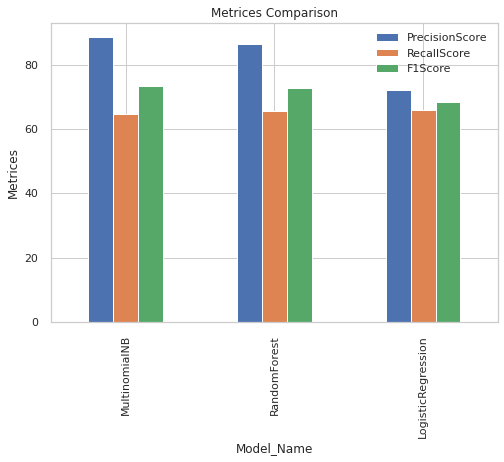

<Figure size 720x360 with 0 Axes>

In [131]:
modelCompare_countVect.plot(kind='bar',x='Model_Name',y=['PrecisionScore','RecallScore','F1Score'], grid=True)
plt.title('Metrices Comparison')
plt.ylabel('Metrices')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

In [132]:


modellist={'Random Forest': RandomForestClassifier(random_state=3),
              'Multinomial Naive Bayes': MultinomialNB(),
              'Logistic Regression': LogisticRegression()}

In [133]:
def classification_Report(modellist):
    for k, item in modellist.items():
      item.fit(X_train_chi_count.toarray(), y_train_count)        
      y_pred = item.predict(X_test_chi_count.toarray())
      report = classification_report(y_test_count, y_pred)   
      print(k)    
      print(report)  
classification_Report(modellist)

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Random Forest
              precision    recall  f1-score   support

           0       0.68      0.97      0.80       829
           1       0.00      0.00      0.00         5
           2       0.88      0.25      0.39        28
           3       0.00      0.00      0.00         4
           4       0.50      0.41      0.45        41
           5       0.63      0.35      0.45        34
           6       0.73      0.36      0.48        22
           7       1.00      0.17      0.29         6
           8       0.00      0.00      0.00        22
           9       0.94      0.94      0.94        16
          10       0.67      0.13      0.22        15
          11       0.62      0.18      0.28        45
          12       0.80      0.28      0.41        43
          13       0.00      0.00      0.00         8
          14       0.00      0.00      0.00         6
          15       0.00      0.00      0.00         8
          16       0.00      0.00      0.00         1
          17 

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



Multinomial Naive Bayes
              precision    recall  f1-score   support

           0       0.66      0.99      0.79       829
           1       0.00      0.00      0.00         5
           2       1.00      0.07      0.13        28
           3       0.00      0.00      0.00         4
           4       0.46      0.41      0.44        41
           5       0.47      0.41      0.44        34
           6       0.62      0.36      0.46        22
           7       1.00      0.17      0.29         6
           8       0.00      0.00      0.00        22
           9       0.92      0.69      0.79        16
          10       0.44      0.47      0.45        15
          11       0.44      0.09      0.15        45
          12       0.52      0.26      0.34        43
          13       1.00      0.12      0.22         8
          14       0.00      0.00      0.00         6
          15       0.00      0.00      0.00         8
          16       0.00      0.00      0.00         1
   

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



###Observations :Block 11:
We have fitted the transformed input with chi square selection to Random forest Logistic Regression and Multinomial Naive Bayes models and plotted the test train accuracy plot.

From the comparison mentioned above it is inferred that though Logistic regression and Random forest gives better training accuracy but the test accuracy comes out to be very poor. Multinomial NB gives 74% training accuracy in the training dataset and 65% in the testing data which shows that it has less amount of overfit. So, for count vectorizer, multinomial NB gives better result in terms of accuracy. Whereas For precision, Random forest is the best. But it is observed that all the models have low recall.

2.Try multiple models for transformed input with TFIDF vectorizer and compare their performence.Plot Accuracy,Precision F1 score and Recall comparison plot for different models.

In [135]:

vectorizer = TfidfVectorizer()
vectorizer.fit(x_train_count)

TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype=<class 'numpy.float64'>, encoding='utf-8',
                input='content', lowercase=True, max_df=1.0, max_features=None,
                min_df=1, ngram_range=(1, 1), norm='l2', preprocessor=None,
                smooth_idf=True, stop_words=None, strip_accents=None,
                sublinear_tf=False, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, use_idf=True, vocabulary=None)

In [136]:
tfidf_tokens = vectorizer.get_feature_names()
print(tfidf_tokens)

['aa', 'aaa', 'aacbcc', 'aacount', 'aae', 'aao', 'aaplant', 'ab', 'abandon', 'abap', 'abb', 'abbc', 'abc', 'abca', 'abd', 'abdhtyu', 'abend', 'abende', 'abended', 'aber', 'abertura', 'abgebildet', 'abgeschlossen', 'abgrtyreu', 'abhanden', 'abhay', 'abhilfe', 'abholen', 'ability', 'abl', 'able', 'abode', 'abort', 'aborted', 'aborting', 'abovementioned', 'abrechnung', 'abreu', 'abrurto', 'absence', 'absender', 'absent', 'absolutely', 'abstechprogramdntym', 'abwfnzwbnvbw', 'ac', 'acache', 'acbccb', 'acc', 'acccount', 'accdb', 'acce', 'accede', 'accept', 'acceptance', 'accesible', 'acceso', 'access', 'accessed', 'accessibility', 'accessible', 'accessing', 'accesss', 'accident', 'accidental', 'accidentally', 'accidently', 'accompany', 'accomplish', 'accont', 'accord', 'accordance', 'accordingly', 'accound', 'account', 'accountant', 'accounting', 'accounts', 'accout', 'accross', 'accrual', 'accse', 'accsess', 'acct', 'accuracy', 'accurate', 'acd', 'ace', 'acess', 'acessos', 'acgyuna', 'ache'

In [137]:
X_train_tfidf = vectorizer.transform(x_train_count)
X_test_tfidf = vectorizer.transform(x_test_count)
X_train_tfidf.shape

(6800, 10409)

In [138]:
mclf = MultinomialNB().fit(X_train_tfidf, y_train_count)
data_m=predict_ml_model(mclf,X_train_tfidf,y_train_count,X_test_tfidf,y_test_count)
modecomparedf['MultinomialNB_TFIdf'] = data_m


accuracy 0.5805882352941176
Training score: 56.04411764705882
Testing score: 58.05882352941176


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [139]:

rclf = RandomForestClassifier()
data_m=predict_ml_model(rclf,X_train_tfidf,y_train_count,X_test_tfidf,y_test_count)
modecomparedf['RandomForestClassifier_TFIdf'] = data_m


accuracy 0.6635294117647059
Training score: 94.88235294117648
Testing score: 66.3529411764706


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [140]:
sclf=LogisticRegression(n_jobs=1, C=1e5)
data_m=predict_ml_model(sclf,X_train_tfidf,y_train_count,X_test_tfidf,y_test_count)
modecomparedf['LogisticRegression_TFIdf'] = data_m


accuracy 0.6888235294117647
Training score: 94.45588235294117
Testing score: 68.88235294117648


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [141]:
lclf= SGDClassifier(loss='hinge', penalty='l2',alpha=1e-3, random_state=42, max_iter=5, tol=None)
data_m=predict_ml_model(lclf,X_train_tfidf,y_train_count,X_test_tfidf,y_test_count)
modecomparedf['SGDClassifier_TFIdf'] = data_m


accuracy 0.65
Training score: 72.48529411764706
Testing score: 65.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [142]:
modecomparedf_new=modecomparedf.drop(["MultinomialNB","RandomForest","LogisticRegression"], axis=1)
modecomparedf_new

,ModelName,MultinomialNB_TFIdf,RandomForestClassifier_TFIdf,LogisticRegression_TFIdf,SGDClassifier_TFIdf
0,TrainAccuracy,56.044118,94.882353,94.455882,72.485294
1,TestAccuracy,58.058824,66.352941,68.882353,65.000000
2,PrecisionScore,98.155633,87.377942,76.605888,87.223336
3,RecallScore,58.058824,66.352941,68.882353,65.000000
4,F1Score,72.266308,73.490544,71.549588,72.177489


In [143]:
modelCompare_TFIDFVect=modecomparedf_new.set_index('ModelName').rename_axis(None).T
modelCompare_TFIDFVect['Model_Name']=['MultinomialNB_TFIdf','RandomForest_TFIdf','LogisticR_TFIdf','SGD_TFIdf']


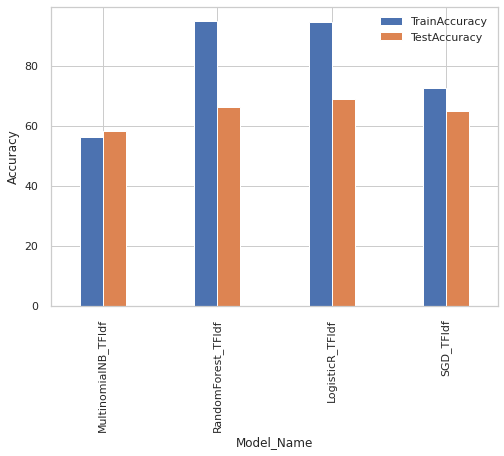

<Figure size 1080x720 with 0 Axes>

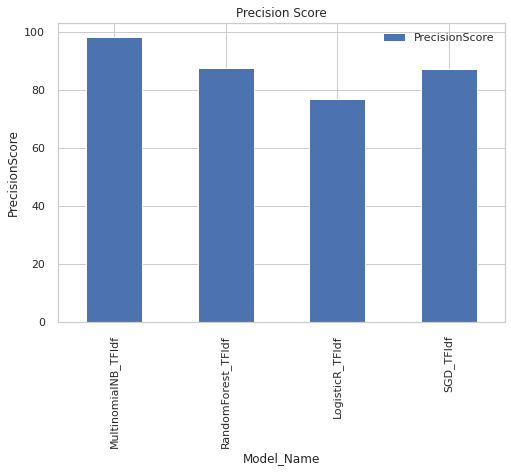

<Figure size 720x360 with 0 Axes>

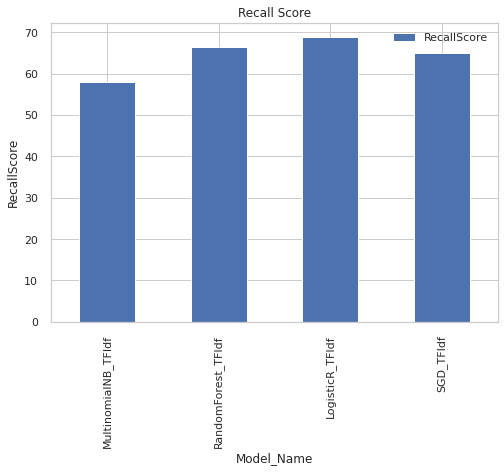

<Figure size 720x360 with 0 Axes>

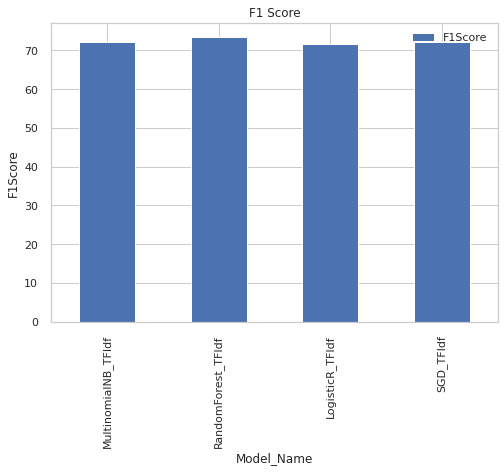

<Figure size 720x360 with 0 Axes>

In [144]:
#Accuracy plot
modelCompare_TFIDFVect.plot(kind='bar',x='Model_Name',y=['TrainAccuracy','TestAccuracy'], grid=True,width = 0.4)
plt.ylabel('Accuracy')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(15,10)) 
plt.show()

#Precision plot
modelCompare_TFIDFVect.plot(kind='bar',x='Model_Name',y='PrecisionScore', grid=True)
plt.title('Precision Score')
plt.ylabel('PrecisionScore')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

#Recall plot

modelCompare_TFIDFVect.plot(kind='bar',x='Model_Name',y='RecallScore', grid=True)
plt.title('Recall Score')
plt.ylabel('RecallScore')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

#F1 score

modelCompare_TFIDFVect.plot(kind='bar',x='Model_Name',y='F1Score', grid=True)
plt.title('F1 Score')
plt.ylabel('F1Score')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

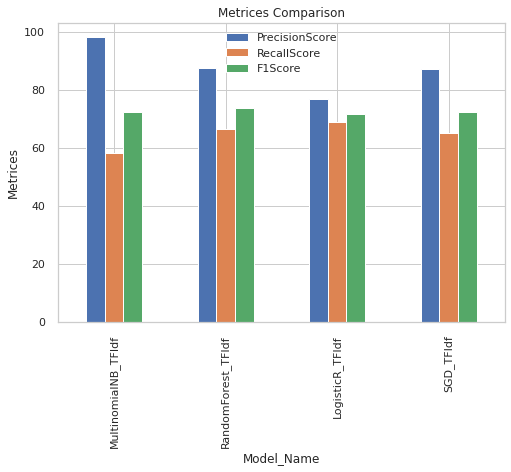

<Figure size 720x360 with 0 Axes>

In [145]:
modelCompare_TFIDFVect.plot(kind='bar',x='Model_Name',y=['PrecisionScore','RecallScore','F1Score'], grid=True)
plt.title('Metrices Comparison')
plt.ylabel('Metrices')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

###Observations:Block:11

We have fitted the transformed input  to Random forest Logistic Regression,SGD  and Multinomial Naive Bayes models and plotted the test train accuracy plot.

From the comparison mentioned above it is inferred that though Logistic regression and Random forest gives better training accuracy but the test accuracy comes out to be very poor. SGD Classifier NB gives 73% training accuracy in the training dataset and 65% in the testing data which shows that it has less amount of overfit. So, for TF-IDF vectorizer, SGD Classifier gives better result in terms of accuracy. It is observed that all the models have low recall.

3.Try multiple models for transformed input with Pipeline with Count then TIDF vectorizer and compare their performence.Plot Accuracy,Precision F1 score and Recall comparison plot for different models.

In [146]:
x_train_tfid, x_test_tfidf, y_train_tfidf, y_test_tfidf = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"], finalticketsummary['Assignment group_num'], test_size=0.3,random_state=0)
                                                             
print(x_train_tfid.shape,x_test_tfidf.shape)
print(y_train_tfidf.shape,y_test_tfidf.shape)

(5950,) (2550,)
(5950,) (2550,)


In [147]:
text_clf = Pipeline([('vect', CountVectorizer()),('tfidf', TfidfTransformer()), ('clf', MultinomialNB())])
#text_clf.fit(x_train_tfid, y_train_tfidf)

In [148]:
data_m=predict_ml_model(text_clf,x_train_tfid,y_train_tfidf,x_test_tfidf,y_test_tfidf)
modecomparedf['MultinomialNB_CountandTFIdf'] = data_m

accuracy 0.563921568627451
Training score: 56.11764705882353
Testing score: 56.392156862745104


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [149]:
text_clf = Pipeline([('vect', CountVectorizer()),('tfidf', TfidfTransformer()), ('clf', LogisticRegression(n_jobs=1, C=1e5))])

In [150]:
data_m=predict_ml_model(text_clf,x_train_tfid,y_train_tfidf,x_test_tfidf,y_test_tfidf)
modecomparedf['LogisticRegression_CountandTFIdf'] = data_m

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



accuracy 0.6623529411764706
Training score: 94.78991596638654
Testing score: 66.23529411764706


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [151]:
text_clf = Pipeline([('vect', CountVectorizer()),('tfidf', TfidfTransformer()), ('clf', RandomForestClassifier())])
data_m=predict_ml_model(text_clf,x_train_tfid,y_train_tfidf,x_test_tfidf,y_test_tfidf)
modecomparedf['RandomForestClassifier_CountandTFIdf'] = data_m

accuracy 0.6498039215686274
Training score: 94.92436974789916


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



Testing score: 64.98039215686275


In [152]:
text_clf = Pipeline([('vect', CountVectorizer()),('tfidf', TfidfTransformer()), ('clf', SGDClassifier(loss='hinge', penalty='l2',alpha=1e-3, random_state=42, max_iter=5, tol=None))])
data_m=predict_ml_model(text_clf,x_train_tfid,y_train_tfidf,x_test_tfidf,y_test_tfidf)
modecomparedf['SGDClassifier_CountandTFIdf'] = data_m

accuracy 0.6462745098039215
Training score: 72.87394957983193
Testing score: 64.62745098039215


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



In [153]:
modecomparedf_pipe=modecomparedf.drop(["MultinomialNB","RandomForest","LogisticRegression","MultinomialNB_TFIdf","RandomForestClassifier_TFIdf","LogisticRegression_TFIdf","SGDClassifier_TFIdf"], axis=1)
modecomparedf_pipe

,ModelName,MultinomialNB_CountandTFIdf,LogisticRegression_CountandTFIdf,RandomForestClassifier_CountandTFIdf,SGDClassifier_CountandTFIdf
0,TrainAccuracy,56.117647,94.789916,94.924370,72.873950
1,TestAccuracy,56.392157,66.235294,64.980392,64.627451
2,PrecisionScore,97.882346,73.683810,87.334063,88.678851
3,RecallScore,56.392157,66.235294,64.980392,64.627451
4,F1Score,70.754169,68.686955,72.242347,72.886427


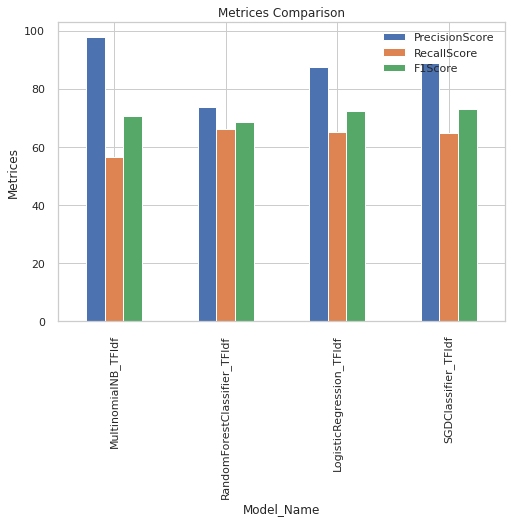

<Figure size 720x360 with 0 Axes>

In [154]:
modelCompare_Pipe=modecomparedf_pipe.set_index('ModelName').rename_axis(None).T
modelCompare_Pipe['Model_Name']=['MultinomialNB_TFIdf','RandomForestClassifier_TFIdf','LogisticRegression_TFIdf','SGDClassifier_TFIdf']

modelCompare_Pipe.plot(kind='bar',x='Model_Name',y=['PrecisionScore','RecallScore','F1Score'], grid=True)
plt.title('Metrices Comparison')
plt.ylabel('Metrices')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

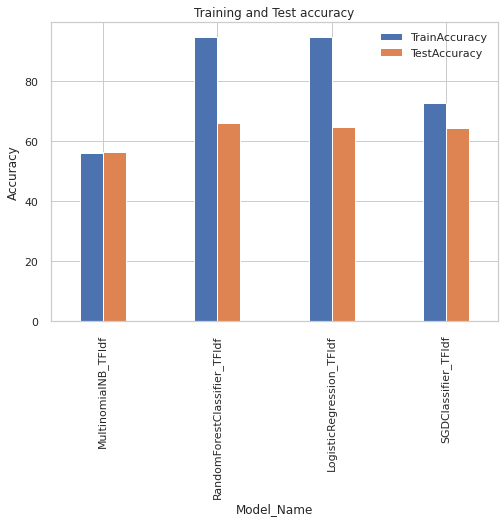

<Figure size 1080x720 with 0 Axes>

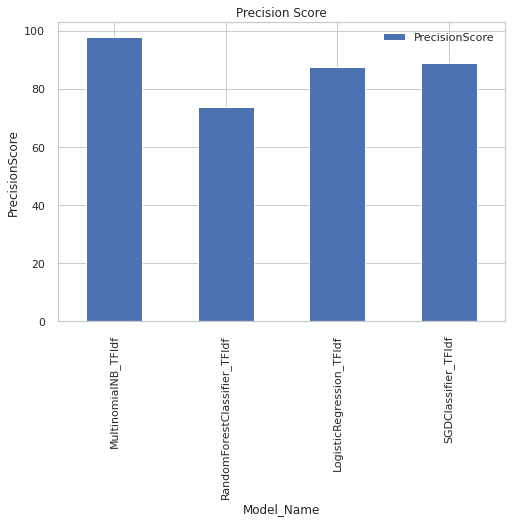

<Figure size 720x360 with 0 Axes>

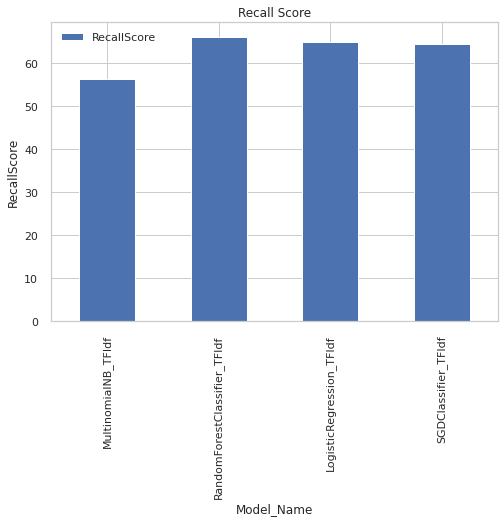

<Figure size 720x360 with 0 Axes>

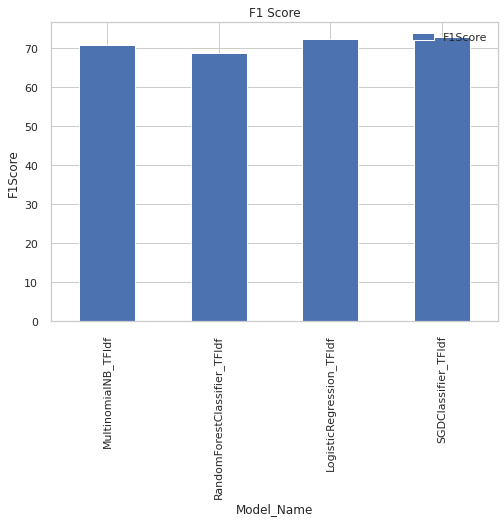

<Figure size 720x360 with 0 Axes>

In [155]:
modelCompare_Pipe.plot(kind='bar',x='Model_Name',y=['TrainAccuracy','TestAccuracy'], grid=True,width = 0.4)
plt.title('Training and Test accuracy')
plt.ylabel('Accuracy')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(15,10)) 

plt.show()

modelCompare_Pipe.plot(kind='bar',x='Model_Name',y='PrecisionScore', grid=True)
plt.title('Precision Score')
plt.ylabel('PrecisionScore')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

modelCompare_Pipe.plot(kind='bar',x='Model_Name',y='RecallScore', grid=True)
plt.title('Recall Score')
plt.ylabel('RecallScore')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()

modelCompare_Pipe.plot(kind='bar',x='Model_Name',y='F1Score', grid=True)
plt.title('F1 Score')
plt.ylabel('F1Score')
#modelCompare_countVect.plot(kind='line',x='Model_Nmae',y='', grid=True)
fig = plt.figure(figsize=(10,5)) 

plt.show()


From the comparison mentioned above it is inferred that though Logistic regression and Random forest gives better training accuracy but the test accuracy comes out to be very poor. SGD Classifier NB gives 73% training accuracy in the training dataset and 65% in the testing data which shows that it has less amount of overfit. So, for Count and TF-IDF vectorizer, SGD Classifier gives better result in terms of accuracy. It is observed that all the models have low recall.

In [156]:
embeddings_index = {}
f = open(EMBEDDING_FILE)
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()
print('Found %s word vectors.' % len(embeddings_index))


Found 400000 word vectors.


###**12.Create the deep learning base model.**

1.Building of basic model with one Embedding,LSTM and Dense layer without weight matrix to check the accuracy.

In [157]:
y = pd.get_dummies(finalticketsummary["Assignment group"]).values
y.shape
#Convert y to onehot encoded output

(8500, 74)

In [158]:
X_train_basic,X_test_basic,y_train_basic,y_test_basic = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)
#70:30 split

In [159]:
print(y_test_basic.shape)
print(y_train_basic.shape)

(2550, 74)
(5950, 74)


In [160]:
print(X_train_basic.shape)
print(X_test_basic.shape)

(5950,)
(2550,)


In [161]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(finalticketsummary["CleanTextAfterRemoveStopword"])
word_index = tokenizer.word_index
vocab_size=len(word_index)+1
##Tokenize the words

In [162]:
vocab_size

#Calculate vocab size

11863

In [163]:
finalticketsummary["WordLength"] = finalticketsummary['CleanTextAfterRemoveStopword'].str.split().str.len()

In [164]:
finalticketsummary['CleanTextAfterRemoveStopword'].loc[1596]

''

In [165]:

finalticketsummary.sort_values(by='WordLength', ascending=False).head()

,Assignment group,CleanTextAfterRemoveStopword,tokenizesummaryafterstopword,Assignment group_num,WordLength
7463,GRP_62,security incident sw possible locky ransomware...,"[security, incident, sw, possible, locky, rans...",59,673
7458,GRP_2,security incident sw possible locky ransomware...,"[security, incident, sw, possible, locky, rans...",12,673
3829,GRP_39,security incident sw magento sql injection sou...,"[security, incident, sw, magento, sql, injecti...",33,581
3831,GRP_2,security incident sw magento sql injection sou...,"[security, incident, sw, magento, sql, injecti...",12,581
3717,GRP_2,security incident possible malware infection t...,"[security, incident, possible, malware, infect...",12,531


In [166]:
sequences = tokenizer.texts_to_sequences(X_train_basic)
X_train_padded = pad_sequences(sequences, maxlen=673)
sequences = tokenizer.texts_to_sequences(X_test_basic)
X_test_padded=pad_sequences(sequences, maxlen=673)
X_test_padded.shape
#padd the input to have same size

(2550, 673)

In [167]:
X_train_padded.shape

(5950, 673)

Base Model with categorical_crossentropy and adam optimizer

In [168]:
embedding_vector_features=100
model=Sequential()
model.add(Embedding(vocab_size,embedding_vector_features,input_length=673))
model.add(LSTM(100,return_sequences=False))
model.add(Dense(74,activation='softmax'))
model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, 673, 100)          1186300   
_________________________________________________________________
lstm (LSTM)                  (None, 100)               80400     
_________________________________________________________________
dense (Dense)                (None, 74)                7474      
Total params: 1,274,174
Trainable params: 1,274,174
Non-trainable params: 0
_________________________________________________________________
None


In [169]:
history=model.fit(X_train_padded,y_train_basic,validation_data=(X_test_padded,y_test_basic),epochs=30,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',min_delta=0.0001,patience=5)])

Epoch 1/30
60/60 [==============================] - 93s 2s/step - loss: 2.8962 - accuracy: 0.4563 - val_loss: 2.4913 - val_accuracy: 0.4753
Epoch 2/30
60/60 [==============================] - 93s 2s/step - loss: 2.3591 - accuracy: 0.5002 - val_loss: 2.1787 - val_accuracy: 0.5420
Epoch 3/30
60/60 [==============================] - 93s 2s/step - loss: 2.0557 - accuracy: 0.5418 - val_loss: 2.0457 - val_accuracy: 0.5478
Epoch 4/30
60/60 [==============================] - 97s 2s/step - loss: 1.8706 - accuracy: 0.5650 - val_loss: 1.9710 - val_accuracy: 0.5553
Epoch 5/30
60/60 [==============================] - 93s 2s/step - loss: 1.7178 - accuracy: 0.5938 - val_loss: 1.9157 - val_accuracy: 0.5604
Epoch 6/30
60/60 [==============================] - 93s 2s/step - loss: 1.5701 - accuracy: 0.6129 - val_loss: 1.8925 - val_accuracy: 0.5588
Epoch 7/30
60/60 [==============================] - 94s 2s/step - loss: 1.4765 - accuracy: 0.6351 - val_loss: 1.8657 - val_accuracy: 0.5588
Epoch 8/30
60/60 [==

In [170]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

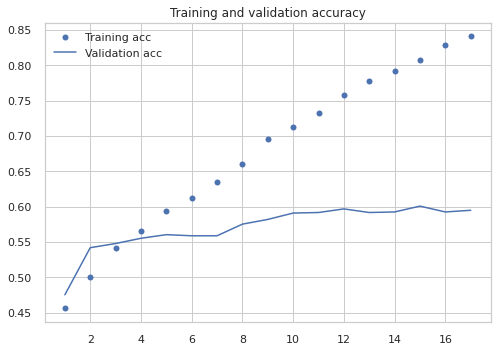

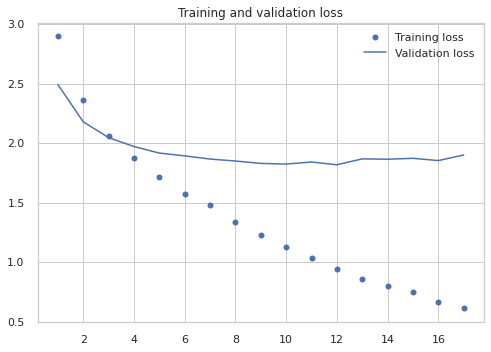

In [171]:


epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

###Observations Block12:
We have created a simple LSTM model with 3 layers without weight matrix and checked the accuracy.It is highly overfitted and the training accuracy is coming high but testing is max 60%.We need to explore more to improve accuracy

The error plots are also plotted which describes we should stop after epoc 10 or need to apply early stopping.

2.Building of basic model with one Embedding,LSTM and Dense layer with weight matrix to check the accuracy.

In [172]:
X_train_Glove,X_test_Glove,y_train_Glove,y_test_Glove = train_test_split(finalticketsummary["CleanTextAfterRemoveStopword"],y,test_size=0.3)

In [173]:
embedding_dim = 100
embedding_matrix = np.zeros((vocab_size, embedding_dim))
for word, i in tokenizer.word_index.items():
    if i < vocab_size:
        embedding_vector = embeddings_index.get(word)
        if embedding_vector is not None:
            embedding_matrix[i] = embedding_vector

In [174]:
sequences = tokenizer.texts_to_sequences(X_train_Glove)
X_train_padded_Glove = pad_sequences(sequences, maxlen=673)
sequences = tokenizer.texts_to_sequences(X_test_Glove)
X_test_padded_Glove=pad_sequences(sequences, maxlen=673)
print(X_test_padded_Glove.shape,X_train_padded_Glove.shape)

(2550, 673) (5950, 673)


In [175]:
model1 = Sequential()
model1.add(Embedding(vocab_size, embedding_dim, weights = [embedding_matrix],input_length = 673,trainable=True))
model1.add(LSTM(128, return_sequences=False))
model1.add(Dense(74, activation='softmax'))
model1.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])
print(model1.summary())

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 673, 100)          1186300   
_________________________________________________________________
lstm_1 (LSTM)                (None, 128)               117248    
_________________________________________________________________
dense_1 (Dense)              (None, 74)                9546      
Total params: 1,313,094
Trainable params: 1,313,094
Non-trainable params: 0
_________________________________________________________________
None


In [176]:
history1=model1.fit(X_train_padded_Glove,y_train_Glove,validation_data=(X_test_padded_Glove,y_test_Glove),epochs=30,batch_size=100,callbacks=[EarlyStopping(monitor='val_loss',patience=7)])

Epoch 1/30
60/60 [==============================] - 125s 2s/step - loss: 2.6715 - accuracy: 0.4782 - val_loss: 2.2001 - val_accuracy: 0.5349
Epoch 2/30
60/60 [==============================] - 127s 2s/step - loss: 2.0322 - accuracy: 0.5408 - val_loss: 1.8921 - val_accuracy: 0.5722
Epoch 3/30
60/60 [==============================] - 125s 2s/step - loss: 1.7759 - accuracy: 0.5808 - val_loss: 1.7422 - val_accuracy: 0.5973
Epoch 4/30
60/60 [==============================] - 128s 2s/step - loss: 1.5765 - accuracy: 0.6136 - val_loss: 1.6436 - val_accuracy: 0.6008
Epoch 5/30
60/60 [==============================] - 131s 2s/step - loss: 1.5051 - accuracy: 0.6286 - val_loss: 1.5917 - val_accuracy: 0.6153
Epoch 6/30
60/60 [==============================] - 127s 2s/step - loss: 1.3416 - accuracy: 0.6534 - val_loss: 1.5332 - val_accuracy: 0.6169
Epoch 7/30
60/60 [==============================] - 126s 2s/step - loss: 1.1997 - accuracy: 0.6768 - val_loss: 1.5114 - val_accuracy: 0.6169
Epoch 8/30
60

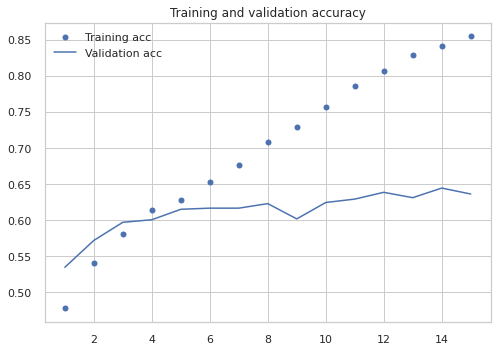

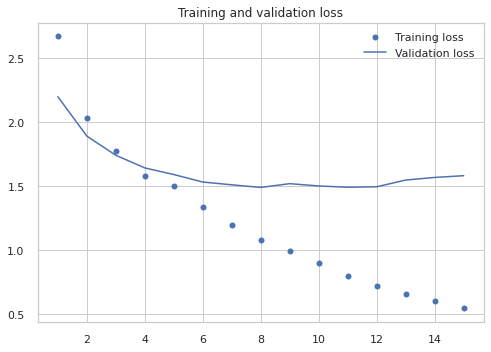

In [177]:
acc = history1.history['accuracy']
val_acc = history1.history['val_accuracy']

loss = history1.history['loss']
val_loss = history1.history['val_loss']
epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [180]:
y_probs = model1.predict(X_test_padded_Glove, verbose=2)
y_pred = to_categorical(y_probs.argmax(axis=1))

report = classification_report(y_test_Glove, y_pred)
print(report)

80/80 - 11s
              precision    recall  f1-score   support

           0       0.83      0.87      0.85      1223
           1       0.40      0.20      0.27        10
           2       0.34      0.49      0.40        39
           3       0.25      0.09      0.13        11
           4       0.52      0.52      0.52        77
           5       0.51      0.40      0.45        48
           6       0.34      0.62      0.44        32
           7       0.38      0.29      0.33        17
           8       0.34      0.63      0.44        19
           9       0.89      0.89      0.89        19
          10       0.38      0.33      0.36        24
          11       0.23      0.27      0.25        66
          12       0.51      0.44      0.47        73
          13       0.00      0.00      0.00        13
          14       0.00      0.00      0.00         7
          15       1.00      0.08      0.15        12
          16       0.20      0.17      0.18         6
          17   

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.



###Observations Block12:
We have created a simple LSTM model with 3 layers with glove embedding  weight matrix and checked the accuracy.The training accuracy is coming high but testing is max 64%.We need to explore more to improve accuracy